# Area-level TDABM analysis

Generate area-level Ball Mapper graphs and robustness checks.


In [1]:
# Optional installation:
# !pip install pyballmapper numpy pandas matplotlib seaborn scikit-learn networkx

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import pyballmapper as pbm

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

pd.set_option("display.max_columns", 160)
pd.set_option("display.max_rows", 120)
sns.set_style("whitegrid")
plt.rcParams.update({"figure.dpi": 100, "font.size": 11})

HERE = Path.cwd().resolve()
PROJECT_ROOT = HERE.parent if HERE.name == "notebooks" else HERE
DATA_DIR = PROJECT_ROOT / "data" / "processed"
AREA_FILE = DATA_DIR / "eda_area_level.csv"
if not AREA_FILE.exists():
    raise FileNotFoundError("Run data_matching_procedure.ipynb first to create eda_area_level.csv.")
OUTPUT_DIR = PROJECT_ROOT / "results"
FIG_DIR = OUTPUT_DIR / "figures"
TABLE_DIR = OUTPUT_DIR / "tdabm_tables"
for folder in [OUTPUT_DIR, FIG_DIR, TABLE_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

hsvp = plt.cm.get_cmap("gist_rainbow")
SEED = 42
np.random.seed(SEED)

print("pyballmapper:", pbm)
print("Current folder:", HERE)
print("Output folder:", OUTPUT_DIR)


pyballmapper: <module 'pyballmapper' from 'D:\\anaconda\\Lib\\site-packages\\pyballmapper\\__init__.py'>
Current folder: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\notebooks
Output folder: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\results


## 1. Load data

In [2]:
def safe_divide(numerator, denominator):
    """Return a numeric ratio while treating zero denominators as missing."""
    numerator = pd.to_numeric(numerator, errors="coerce")
    denominator = pd.to_numeric(denominator, errors="coerce")
    return np.where(denominator > 0, numerator / denominator, np.nan)


def add_census_rates(df):
    """Create Rudkin-inspired broad percentage categories for the TDABM point cloud."""
    out = df.copy()

    out["age_0_15_pct"] = safe_divide(out["age_0_15"], out["population_total"])
    out["age_16_24_pct"] = safe_divide(out["age_16_24"], out["population_total"])
    out["age_25_64_pct"] = safe_divide(
        out[["age_25_34", "age_35_49", "age_50_64"]].sum(axis=1), out["population_total"]
    )
    out["age_65_plus_pct"] = safe_divide(out["age_65_plus"], out["population_total"])

    household_den = out["households_total"]
    for col in ["deprived_0", "deprived_1", "deprived_2_plus"]:
        out[f"{col}_pct"] = safe_divide(out[col], household_den)
    car_den = out["car_households_total"]
    out["cars_0_pct"] = safe_divide(out["cars_0"], car_den)
    out["cars_1_pct"] = safe_divide(out["cars_1"], car_den)
    out["cars_2_plus_pct"] = safe_divide(out["cars_2"] + out["cars_3_plus"], car_den)

    health_den = out["health_total"]
    out["health_very_good_pct"] = safe_divide(out["health_very_good"], health_den)
    out["health_good_pct"] = safe_divide(out["health_good"], health_den)
    out["health_other_pct"] = safe_divide(
        out[["health_fair", "health_bad", "health_very_bad"]].sum(axis=1), health_den
    )
    out["health_bad_very_bad_pct"] = safe_divide(out["health_bad"] + out["health_very_bad"], health_den)
    out["disabled_pct"] = safe_divide(out["disabled"], out["disability_total"])

    education_den = out["education_total_16_plus"]
    out["education_no_qualifications_pct"] = safe_divide(out["education_no_qualifications"], education_den)
    for col in ["education_low", "education_middle", "education_higher"]:
        out[f"{col}_pct"] = safe_divide(out[col], education_den)

    ns_den = out["nssec_total_16_plus"]
    out["nssec_managerial_professional_small_employers_pct"] = safe_divide(
        out["nssec_managerial_professional"] + out["nssec_small_employers_own_account"], ns_den
    )
    out["nssec_intermediate_lower_supervisory_pct"] = safe_divide(
        out["nssec_intermediate"] + out["nssec_lower_supervisory_technical"], ns_den
    )
    out["nssec_semi_routine_routine_pct"] = safe_divide(out["nssec_semi_routine_routine"], ns_den)
    out["nssec_never_worked_long_term_unemployed_pct"] = safe_divide(out["nssec_never_worked_long_term_unemployed"], ns_den)

    econ_den = out["economic_activity_total_16_plus"]
    out["employed_total_pct"] = safe_divide(out[[
        "employee_part_time", "employee_full_time",
        "self_employed_part_time", "self_employed_full_time",
    ]].sum(axis=1), econ_den)
    out["unemployed_pct"] = safe_divide(out["unemployed"], econ_den)
    out["inactive_retired_pct"] = safe_divide(out["inactive_retired"], econ_den)
    out["inactive_long_term_sick_disabled_pct"] = safe_divide(out["inactive_long_term_sick_disabled"], econ_den)
    out["inactive_other_total_pct"] = safe_divide(out[[
        "inactive_student", "inactive_home_family", "inactive_other",
    ]].sum(axis=1), econ_den)

    industry_den = out["industry_total_with_code"]
    out["industry_production_pct"] = safe_divide(out[[
        "industry_agriculture_energy_water", "industry_manufacturing", "industry_construction",
    ]].sum(axis=1), industry_den)
    out["industry_distribution_transport_pct"] = safe_divide(out[[
        "industry_distribution_hotels_restaurants", "industry_transport_communication",
    ]].sum(axis=1), industry_den)
    out["industry_finance_real_estate_professional_admin_pct"] = safe_divide(
        out["industry_finance_real_estate_professional_admin"], industry_den
    )
    out["industry_public_other_services_pct"] = safe_divide(out[[
        "industry_public_admin_education_health", "industry_other",
    ]].sum(axis=1), industry_den)

    # Detailed components are used only by the expanded-variable robustness check.
    for col in ["age_25_34", "age_35_49", "age_50_64"]:
        out[f"{col}_pct"] = safe_divide(out[col], out["population_total"])
    out["cars_2_pct"] = safe_divide(out["cars_2"], car_den)
    out["cars_3_plus_pct"] = safe_divide(out["cars_3_plus"], car_den)
    for col in ["health_fair", "health_bad", "health_very_bad"]:
        out[f"{col}_pct"] = safe_divide(out[col], health_den)
    out["education_apprenticeship_pct"] = safe_divide(
        out["education_apprenticeship"], education_den
    )
    out["education_l1_only_pct"] = (
        out["education_low_pct"] - out["education_no_qualifications_pct"]
    ).clip(lower=0)
    out["education_l2_only_pct"] = (
        out["education_middle_pct"] - out["education_apprenticeship_pct"]
    ).clip(lower=0)
    for col in [
        "nssec_managerial_professional", "nssec_intermediate",
        "nssec_small_employers_own_account", "nssec_lower_supervisory_technical",
        "nssec_full_time_students",
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], ns_den)
    for col in [
        "employee_part_time", "employee_full_time", "self_employed_part_time",
        "self_employed_full_time", "inactive_student", "inactive_home_family", "inactive_other",
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], econ_den)
    for col in [
        "industry_agriculture_energy_water", "industry_manufacturing",
        "industry_construction", "industry_distribution_hotels_restaurants",
        "industry_transport_communication", "industry_public_admin_education_health",
        "industry_other",
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], industry_den)
    return out


def get_numeric_series(df, col):
    """Coerce one display variable to numeric and fill only for graph colouring."""
    values = df.loc[:, col]
    if isinstance(values, pd.DataFrame):
        values = values.iloc[:, 0]
    return pd.to_numeric(values, errors="coerce")


def points_and_balls_df(bm):
    """Return the many-to-many observation/ball membership table from pyballmapper."""
    """Return pyballmapper membership table with exactly two columns: point, ball."""
    pb = bm.points_and_balls()
    if not isinstance(pb, pd.DataFrame):
        pb = pd.DataFrame(pb)

    rename = {}
    for c in pb.columns:
        lc = str(c).lower()
        if lc in ["point", "points", "data_point", "index"]:
            rename[c] = "point"
        if lc in ["ball", "balls", "landmark"]:
            rename[c] = "ball"
    pb = pb.rename(columns=rename)

    point_cols = [c for c in pb.columns if c == "point"]
    ball_cols = [c for c in pb.columns if c == "ball"]
    if not point_cols or not ball_cols:
        raise ValueError(f"Unexpected points_and_balls() columns: {pb.columns.tolist()}")

    # Use .iloc so duplicate column names cannot produce a DataFrame later.
    point_pos = list(pb.columns).index(point_cols[0])
    ball_pos = list(pb.columns).index(ball_cols[0])
    out = pd.DataFrame({
        "point": pd.to_numeric(pb.iloc[:, point_pos], errors="coerce").astype("Int64"),
        "ball": pd.to_numeric(pb.iloc[:, ball_pos], errors="coerce").astype("Int64"),
    }).dropna()
    out["point"] = out["point"].astype(int)
    out["ball"] = out["ball"].astype(int)
    return out


def ball_sizes_from_pbm(bm):
    """Count observation memberships for every Ball Mapper node."""
    pb = points_and_balls_df(bm)
    return pb.groupby("ball", sort=True)["point"].size()


def ball_means_from_pbm(df_bm, bm, color_var):
    """Calculate the displayed variable mean and membership count for each ball."""
    pb = points_and_balls_df(bm).rename(columns={"point": "_point"})
    tmp = pd.DataFrame({
        "_point": np.arange(len(df_bm), dtype=int),
        "_value": get_numeric_series(df_bm, color_var).to_numpy(),
    })
    merged = tmp.merge(pb, on="_point", how="inner")
    means = merged.groupby("ball", sort=True)["_value"].mean()
    sizes = merged.groupby("ball", sort=True)["_point"].size()
    means.name = color_var
    sizes.name = "n_points"
    return means, sizes, merged

def build_pbm(X, eps, color_series=None, color_name="color"):
    """Construct Ball Mapper with the reproducible landmark order set by SEED."""
    landmark_order = np.random.default_rng(SEED).permutation(len(X)).tolist()
    if color_series is None:
        return pbm.BallMapper(X=X, eps=float(eps), order=landmark_order)
    cdf = pd.DataFrame({color_name: pd.to_numeric(color_series, errors="coerce")})
    return pbm.BallMapper(
        X=X, eps=float(eps), order=landmark_order, coloring_df=cdf
    )


def bm_stats_pbm(X, eps):
    """Summarise graph size, connectivity, memberships and overlap at one epsilon."""
    bm = build_pbm(X, eps)
    sizes = ball_sizes_from_pbm(bm)
    return {
        "eps": float(eps),
        "n_balls": bm.Graph.number_of_nodes(),
        "n_edges": bm.Graph.number_of_edges(),
        "n_components": nx.number_connected_components(bm.Graph) if bm.Graph.number_of_nodes() else 0,
        "avg_ball_size": float(sizes.mean()) if len(sizes) else np.nan,
        "max_ball_size": int(sizes.max()) if len(sizes) else 0,
        "avg_overlaps": float(sizes.sum() / len(X)) if len(X) else np.nan,
    }


def draw_pbm_custom(df_bm, X, eps, color_var, colorbar_label, filename, pos=None, bm=None):
    """Recolour one existing Ball Mapper graph and save the publication figure."""
    # Recolour the existing graph without changing membership.
    if bm is None:
        bm = build_pbm(X, eps)
    if pos is None:
        pos = nx.spring_layout(bm.Graph, k=2.5, scale=3.0, seed=SEED)

    means, sizes, _ = ball_means_from_pbm(df_bm, bm, color_var)
    means = pd.to_numeric(means, errors="coerce").dropna()
    if means.empty:
        raise ValueError(f"No numeric values available for coloring variable: {color_var}")

    vmin = float(means.quantile(0.02))
    vmax = float(means.quantile(0.98))
    if pd.isna(vmin) or pd.isna(vmax) or vmin == vmax:
        vmin = float(means.min())
        vmax = float(means.max() + 1e-9)
    norm = plt.Normalize(vmin=vmin, vmax=vmax)

    node_list = list(bm.Graph.nodes())
    node_colours = [hsvp(norm(np.clip(means.get(n, vmin), vmin, vmax))) for n in node_list]

    # Linearly map membership counts to the configured node-area range.
    if NODE_SIZE_MIN <= 0 or NODE_SIZE_MAX <= NODE_SIZE_MIN:
        raise ValueError("Set NODE_SIZE_MIN > 0 and NODE_SIZE_MAX > NODE_SIZE_MIN.")
    raw_memberships = np.array([sizes.get(n, 1) for n in node_list], dtype=float)
    if np.ptp(raw_memberships) == 0:
        node_sizes = np.full(
            len(node_list), (NODE_SIZE_MIN + NODE_SIZE_MAX) / 2.0
        )
    else:
        node_sizes = np.interp(
            raw_memberships,
            [raw_memberships.min(), raw_memberships.max()],
            [float(NODE_SIZE_MIN), float(NODE_SIZE_MAX)],
        )

    fig, ax = plt.subplots(figsize=(16, 12))
    nx.draw_networkx_edges(bm.Graph, pos=pos, ax=ax, edge_color="#999999", width=1.0, alpha=0.6)
    nx.draw_networkx_nodes(
        bm.Graph, pos=pos, ax=ax, nodelist=node_list, node_color=node_colours,
        node_size=node_sizes, alpha=0.88, linewidths=1.0, edgecolors="white"
    )
    large = {n: str(n) for n in node_list if sizes.get(n, 0) >= 200}
    small = {n: str(n) for n in node_list if sizes.get(n, 0) < 200}
    nx.draw_networkx_labels(bm.Graph, pos=pos, ax=ax, labels=large, font_size=11, font_color="black", font_weight="bold")
    nx.draw_networkx_labels(bm.Graph, pos=pos, ax=ax, labels=small, font_size=8, font_color="#555555")

    sm = plt.cm.ScalarMappable(cmap=hsvp, norm=norm)
    sm.set_array([])
    cb = plt.colorbar(sm, ax=ax, shrink=0.65, pad=0.02)
    cb.set_label(colorbar_label, fontsize=16)
    cb.ax.tick_params(labelsize=15)
    ax.set_axis_off()
    plt.tight_layout()
    plt.savefig(FIG_DIR / filename, dpi=150, bbox_inches="tight", facecolor="white")
    plt.show()
    return bm, pos

df = pd.read_csv(AREA_FILE, low_memory=False)
df = add_census_rates(df)
# Martin-Oliver (2019) risk-set logic, adapted to observed status records.
df["bank_history"] = (df["bank_count_open"] + df["bank_count_closed"] > 0)
df = df.loc[df["bank_history"]].copy()
df["complete_withdrawal"] = (
    (df["bank_count_closed"] > 0) & (df["bank_count_open"] == 0)
).astype(int)
df["retained_provision"] = (df["bank_count_open"] > 0).astype(int)
assert (df["complete_withdrawal"] + df["retained_provision"] == 1).all()
assert "is_closed" not in df.columns

# Area-level data contract: closed branch records help define withdrawal, but
# the TDABM outcome is whether any open provision remains in the host area.
area_outcome_audit = (
    df.groupby(["complete_withdrawal", "retained_provision"], observed=True)
    .agg(areas=("area_code", "size"),
         open_branch_records=("bank_count_open", "sum"),
         closed_branch_records=("bank_count_closed", "sum"))
    .reset_index()
)
print("Area-level outcome audit: complete withdrawal and retained provision")
display(area_outcome_audit)

ID_COL = "area_code"
STRATA = ["country", "complete_withdrawal"]
SPLIT_VAR = "complete_withdrawal"
BM_FEATURES = [
    # Age structure
    "age_0_15_pct", "age_16_24_pct", "age_25_64_pct", "age_65_plus_pct",
    # Household deprivation and car availability
    "deprived_0_pct", "deprived_1_pct", "deprived_2_plus_pct",
    "cars_0_pct", "cars_1_pct", "cars_2_plus_pct",
    # Self-reported health and disability
    "health_very_good_pct", "health_good_pct", "health_other_pct", "disabled_pct",
    # Qualification groups
    "education_low_pct", "education_middle_pct", "education_higher_pct",
    # NS-SEC groups
    "nssec_managerial_professional_small_employers_pct",
    "nssec_intermediate_lower_supervisory_pct",
    "nssec_semi_routine_routine_pct",
    "nssec_never_worked_long_term_unemployed_pct",
    # Economic activity
    "employed_total_pct", "unemployed_pct", "inactive_retired_pct",
    "inactive_long_term_sick_disabled_pct", "inactive_other_total_pct",
    # Industry structure
    "industry_production_pct", "industry_distribution_transport_pct",
    "industry_finance_real_estate_professional_admin_pct",
    "industry_public_other_services_pct",
]
assert len(BM_FEATURES) == 30 and len(set(BM_FEATURES)) == 30
assert SPLIT_VAR not in BM_FEATURES

# Export the area outcome once; retained provision is its exact complement.
# Every census distance coordinate is exported separately for profile interpretation.
OUTCOME_VARS = ["complete_withdrawal", "retained_provision"]
COLOR_VARS = ["complete_withdrawal", "retained_provision"] + BM_FEATURES
COLOR_LABELS = {
    "complete_withdrawal": "Complete-withdrawal share",
    "retained_provision": "Retained-provision share",
    "age_0_15_pct": "Population aged 0-15 (share)",
    "age_16_24_pct": "Population aged 16-24 (share)",
    "age_25_64_pct": "Population aged 25-64 (share)",
    "age_65_plus_pct": "Population aged 65+ (share)",
    "deprived_0_pct": "Households deprived in no dimensions (share)",
    "deprived_1_pct": "Households deprived in one dimension (share)",
    "deprived_2_plus_pct": "Households deprived in 2+ dimensions (share)",
    "cars_0_pct": "Households with no car or van (share)",
    "cars_1_pct": "Households with one car or van (share)",
    "cars_2_plus_pct": "Households with 2+ cars or vans (share)",
    "health_very_good_pct": "Very good health (share)",
    "health_good_pct": "Good health (share)",
    "health_other_pct": "Fair, bad or very bad health (share)",
    "disabled_pct": "Disabled population (share)",
    "education_low_pct": "Qualification group 1: None + L1 equivalent (share)",
    "education_middle_pct": "Qualification group 2: L2 + apprenticeship equivalent (share)",
    "education_higher_pct": "Qualification group 3: L3 + L4 equivalent (share)",
    "nssec_managerial_professional_small_employers_pct": "Managerial, professional and small-employer NS-SEC (share)",
    "nssec_intermediate_lower_supervisory_pct": "Intermediate and lower-supervisory NS-SEC (share)",
    "nssec_semi_routine_routine_pct": "Semi-routine and routine NS-SEC (share)",
    "nssec_never_worked_long_term_unemployed_pct": "Never worked or long-term unemployed NS-SEC (share)",
    "employed_total_pct": "Employed population aged 16+ (share)",
    "unemployed_pct": "Unemployed population aged 16+ (share)",
    "inactive_retired_pct": "Economically inactive: retired (share)",
    "inactive_long_term_sick_disabled_pct": "Economically inactive: long-term sick or disabled (share)",
    "inactive_other_total_pct": "Other economic inactivity (share)",
    "industry_production_pct": "Production industries (share)",
    "industry_distribution_transport_pct": "Distribution, hospitality and transport industries (share)",
    "industry_finance_real_estate_professional_admin_pct": "Finance, real estate, professional and administrative industries (share)",
    "industry_public_other_services_pct": "Public and other services (share)",
}
AUXILIARY_VARS = ["population_total", "health_bad_very_bad_pct", "education_no_qualifications_pct"]
MAX_N = None

model_cols = list(dict.fromkeys([ID_COL] + STRATA + BM_FEATURES + OUTCOME_VARS + COLOR_VARS + AUXILIARY_VARS))
model = df[model_cols].replace([np.inf, -np.inf], np.nan).dropna(subset=BM_FEATURES + [SPLIT_VAR]).reset_index(drop=True)
print("model shape:", model.shape)
display(model[COLOR_VARS].describe().T)


Area-level outcome audit: complete withdrawal and retained provision


,complete_withdrawal,retained_provision,areas,open_branch_records,closed_branch_records
0,0,1,2352,5243,3871
1,1,0,1746,0,2440


model shape: (4098, 37)


,count,mean,std,min,25%,50%,75%,max
complete_withdrawal,4098.0,0.426061,0.494563,0.000000,0.000000,0.000000,1.000000,1.000000
retained_provision,4098.0,0.573939,0.494563,0.000000,0.000000,1.000000,1.000000,1.000000
age_0_15_pct,4098.0,0.156760,0.051040,0.002871,0.126585,0.157127,0.187413,0.400124
age_16_24_pct,4098.0,0.117680,0.100147,0.027778,0.077022,0.091320,0.112777,0.866955
age_25_64_pct,4098.0,0.526805,0.077525,0.083075,0.489191,0.524864,0.566678,0.825080
age_65_plus_pct,4098.0,0.198735,0.095229,0.001764,0.126104,0.196046,0.265310,0.580808
deprived_0_pct,4098.0,0.466041,0.103703,0.165179,0.394112,0.464975,0.540148,0.785016
deprived_1_pct,4098.0,0.339552,0.038968,0.179153,0.316641,0.341992,0.365988,0.468641
deprived_2_plus_pct,4098.0,0.194445,0.082027,0.024775,0.132043,0.182876,0.246583,0.589286
cars_0_pct,4098.0,0.313012,0.174312,0.023656,0.178402,0.273816,0.411242,0.897600


In [3]:
# Manuscript Table 2: area-level TDABM axes and descriptive statistics.
from scipy.stats import ttest_ind

table_groups = [
    ("Age", [
        ("age_0_15_pct", "Age 0--15"), ("age_16_24_pct", "Age 16--24"),
        ("age_25_64_pct", "Age 25--64"), ("age_65_plus_pct", "Age 65 and over"),
    ]),
    ("Deprivation", [
        ("deprived_0_pct", "Not deprived"),
        ("deprived_1_pct", "Deprived in one dimension"),
        ("deprived_2_plus_pct", "Deprived in two or more dimensions"),
    ]),
    ("Car availability", [
        ("cars_0_pct", "No car or van"), ("cars_1_pct", "One car or van"),
        ("cars_2_plus_pct", "Two or more cars or vans"),
    ]),
    ("Health and disability", [
        ("health_very_good_pct", "Very good health"), ("health_good_pct", "Good health"),
        ("health_other_pct", "Fair, bad or very bad health"),
        ("disabled_pct", "Disabled under the Equality Act"),
    ]),
    ("Qualifications", [
        ("education_low_pct", "Group 1: None + L1 equivalent"),
        ("education_middle_pct", "Group 2: L2 + apprenticeship equivalent"),
        ("education_higher_pct", "Group 3: L3 + L4 equivalent"),
    ]),
    ("NS-SEC", [
        ("nssec_managerial_professional_small_employers_pct", "Managerial, professional and small employers"),
        ("nssec_intermediate_lower_supervisory_pct", "Intermediate and lower supervisory"),
        ("nssec_semi_routine_routine_pct", "Semi-routine and routine"),
        ("nssec_never_worked_long_term_unemployed_pct", "Never worked or long-term unemployed"),
    ]),
    ("Economic activity", [
        ("employed_total_pct", "Employed or self-employed"), ("unemployed_pct", "Unemployed"),
        ("inactive_retired_pct", "Economically inactive: retired"),
        ("inactive_long_term_sick_disabled_pct", "Inactive: long-term sick or disabled"),
        ("inactive_other_total_pct", "Other economic inactivity"),
    ]),
    ("Industry", [
        ("industry_production_pct", "Production and construction"),
        ("industry_distribution_transport_pct", "Distribution, hospitality and transport"),
        ("industry_finance_real_estate_professional_admin_pct", "Finance, real estate, professional and administration"),
        ("industry_public_other_services_pct", "Public and other services"),
    ]),
]
table_rows = []
for domain, variables in table_groups:
    for variable, label in variables:
        values = pd.to_numeric(model[variable], errors="coerce") * 100
        withdrawal = values[model["complete_withdrawal"].eq(1)]
        retained = values[model["complete_withdrawal"].eq(0)]
        p_value = ttest_ind(withdrawal, retained, equal_var=False, nan_policy="omit").pvalue
        marker = "***" if p_value < 0.01 else "**" if p_value < 0.05 else "*" if p_value < 0.10 else ""
        table_rows.append({
            "Census domain": domain,
            "Axis category": label,
            "Mean (SD)": f"{values.mean():.1f} ({values.std(ddof=1):.1f})",
            "Range": f"{values.min():.1f}--{values.max():.1f}",
            "Complete withdrawal": round(withdrawal.mean(), 1),
            "Retained provision": round(retained.mean(), 1),
            "Difference": round(withdrawal.mean() - retained.mean(), 1),
            "Welch marker": marker,
        })

manuscript_table_2 = pd.DataFrame(table_rows)
print("Manuscript Table 2: Area-level TDABM axes and descriptive statistics")
print("Difference = complete-withdrawal mean minus retained-provision mean; values are percentage points.")
display(manuscript_table_2)
manuscript_table_2.to_csv(TABLE_DIR / "manuscript_table_2_area_tdabm_axes.csv", index=False)

# All values below are percentages; Difference is complete withdrawal minus retained provision.
area_descriptive_statistics = (
    model[BM_FEATURES].describe(percentiles=[0.25, 0.50, 0.75]).T
    .rename(columns={"count": "N", "mean": "Mean", "std": "SD", "min": "Min",
                     "25%": "P25", "50%": "Median", "75%": "P75", "max": "Max"})
    .mul({"N": 1, "Mean": 100, "SD": 100, "Min": 100,
          "P25": 100, "Median": 100, "P75": 100, "Max": 100})
)
area_outcome_means = (
    model.groupby("complete_withdrawal", observed=True)[BM_FEATURES].mean().T.mul(100)
    .rename(columns={0: "Retained provision mean", 1: "Complete withdrawal mean"})
)
area_statistics_and_difference = area_descriptive_statistics.join(area_outcome_means)
area_statistics_and_difference["Difference (percentage points)"] = (
    area_statistics_and_difference["Complete withdrawal mean"]
    - area_statistics_and_difference["Retained provision mean"]
)
area_statistics_and_difference = area_statistics_and_difference.round(3)
print("Area-level descriptive statistics and Difference for all 30 TDABM variables")
display(area_statistics_and_difference)
area_statistics_and_difference.to_csv(
    TABLE_DIR / "area_tdabm_descriptive_statistics_and_difference.csv",
    index_label="variable",
)


Manuscript Table 2: Area-level TDABM axes and descriptive statistics
Difference = complete-withdrawal mean minus retained-provision mean; values are percentage points.


,Census domain,Axis category,Mean (SD),Range,Complete withdrawal,Retained provision,Difference,Welch marker
0,Age,Age 0--15,15.7 (5.1),0.3--40.0,16.4,15.1,1.3,***
1,Age,Age 16--24,11.8 (10.0),2.8--86.7,12.0,11.6,0.5,
2,Age,Age 25--64,52.7 (7.8),8.3--82.5,52.6,52.8,-0.2,
3,Age,Age 65 and over,19.9 (9.5),0.2--58.1,19.0,20.5,-1.5,***
4,Deprivation,Not deprived,46.6 (10.4),16.5--78.5,48.0,45.6,2.4,***
5,Deprivation,Deprived in one dimension,34.0 (3.9),17.9--46.9,33.4,34.3,-0.9,***
6,Deprivation,Deprived in two or more dimensions,19.4 (8.2),2.5--58.9,18.6,20.1,-1.5,***
7,Car availability,No car or van,31.3 (17.4),2.4--89.8,29.7,32.5,-2.7,***
8,Car availability,One car or van,42.0 (7.1),9.6--59.5,41.9,42.0,-0.1,
9,Car availability,Two or more cars or vans,26.7 (14.0),0.0--71.4,28.3,25.5,2.8,***


Area-level descriptive statistics and Difference for all 30 TDABM variables


,N,Mean,SD,Min,P25,Median,P75,Max,Retained provision mean,Complete withdrawal mean,Difference (percentage points)
age_0_15_pct,4098.0,15.676,5.104,0.287,12.659,15.713,18.741,40.012,15.142,16.395,1.253
age_16_24_pct,4098.0,11.768,10.015,2.778,7.702,9.132,11.278,86.696,11.560,12.049,0.489
age_25_64_pct,4098.0,52.681,7.753,8.308,48.919,52.486,56.668,82.508,52.765,52.566,-0.199
age_65_plus_pct,4098.0,19.874,9.523,0.176,12.610,19.605,26.531,58.081,20.533,18.985,-1.548
deprived_0_pct,4098.0,46.604,10.370,16.518,39.411,46.497,54.015,78.502,45.573,47.993,2.420
deprived_1_pct,4098.0,33.955,3.897,17.915,31.664,34.199,36.599,46.864,34.348,33.426,-0.922
deprived_2_plus_pct,4098.0,19.445,8.203,2.477,13.204,18.288,24.658,58.929,20.087,18.579,-1.507
cars_0_pct,4098.0,31.301,17.431,2.366,17.840,27.382,41.124,89.760,32.467,29.731,-2.735
cars_1_pct,4098.0,42.000,7.059,9.600,38.916,43.171,46.482,59.531,42.038,41.949,-0.089
cars_2_plus_pct,4098.0,26.705,13.963,0.000,15.485,26.651,36.929,71.394,25.509,28.316,2.807


## 2. Create the area-level point cloud

`bm_df` retains complete-feature observations from the literature-aligned risk set. `X` standardises 30 host-neighbourhood characteristics organised into several census groups before Euclidean distances are calculated. Banking outcomes do not enter `BM_FEATURES`; they colour a graph constructed only from socio-economics characteristics.

In [4]:
# No down-sampling is required for the reported analysis; retain every complete row.
bm_df = model.copy().reset_index(drop=True)
X = StandardScaler().fit_transform(bm_df[BM_FEATURES])
print("TDABM rows:", bm_df.shape)
display(bm_df.groupby(STRATA, dropna=False).size().to_frame("rows").head(30))


TDABM rows: (4098, 37)


rows
country  complete_withdrawal      
England  0                    1702
         1                    1415
Scotland 0                     476
         1                     250
Wales    0                     174
         1                      81

## 3. Examine epsilon from 5.5 to 8.5

Scan epsilon from 5.5 to 8.5 in steps of 0.1 and record ball counts, connectivity, sizes and overlap. Smaller radii retain detail but may fragment the graph; larger radii smooth local differences. Use the scan to choose the radius will be used in the main analysis.


In [5]:
eps_values = np.unique(np.round(np.arange(5.5, 8.5 + 0.001, 0.1), 3))
eps_records = []
for eps in eps_values:
    rec = bm_stats_pbm(X, eps)
    eps_records.append(rec)
    print(f"eps={eps:.3f} | balls={rec['n_balls']} | edges={rec['n_edges']} | components={rec['n_components']} | avg_size={rec['avg_ball_size']:.1f}")

eps_df = pd.DataFrame(eps_records)
EPS_FINE = 5.5
EPS_MAIN = 7.0
EPS_BROAD = 8.5

eps_df.to_csv(TABLE_DIR / "area_tdabm_pyballmapper_epsilon_selection.csv", index=False)
print("Epsilon validation range: 5.5 to 8.5, step 0.1")
print("Selected EPS_FINE, EPS_MAIN, EPS_BROAD:", EPS_FINE, EPS_MAIN, EPS_BROAD)
display(eps_df)


eps=5.500 | balls=76 | edges=574 | components=7 | avg_size=226.2
eps=5.600 | balls=68 | edges=483 | components=7 | avg_size=238.8
eps=5.700 | balls=66 | edges=483 | components=7 | avg_size=228.3
eps=5.800 | balls=59 | edges=403 | components=6 | avg_size=267.8
eps=5.900 | balls=59 | edges=405 | components=6 | avg_size=282.1
eps=6.000 | balls=55 | edges=411 | components=6 | avg_size=327.8
eps=6.100 | balls=47 | edges=303 | components=5 | avg_size=351.6
eps=6.200 | balls=45 | edges=303 | components=4 | avg_size=349.2
eps=6.300 | balls=44 | edges=323 | components=4 | avg_size=401.6
eps=6.400 | balls=42 | edges=281 | components=3 | avg_size=391.6
eps=6.500 | balls=37 | edges=227 | components=2 | avg_size=408.2
eps=6.600 | balls=37 | edges=216 | components=1 | avg_size=356.7
eps=6.700 | balls=36 | edges=209 | components=1 | avg_size=359.4
eps=6.800 | balls=33 | edges=181 | components=1 | avg_size=392.2
eps=6.900 | balls=29 | edges=156 | components=1 | avg_size=415.3
eps=7.000 | balls=28 | ed

,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps
0,5.5,76,574,7,226.184211,2472,4.194729
1,5.6,68,483,7,238.750000,2539,3.961689
2,5.7,66,483,7,228.272727,2606,3.676428
3,5.8,59,403,6,267.796610,2691,3.855539
4,5.9,59,405,6,282.118644,2752,4.061737
5,6.0,55,411,6,327.763636,2816,4.398975
6,6.1,47,303,5,351.574468,2868,4.032211
7,6.2,45,303,4,349.222222,2919,3.834797
8,6.3,44,323,4,401.613636,2980,4.312103
9,6.4,42,281,3,391.571429,3032,4.013177


In [6]:
# Manuscript Table 8: empirical Ball Mapper settings used in both analytical files.
manuscript_table_8 = pd.DataFrame({
    "Analysis": ["Area level", "Bank level"],
    "Observation represented by one point": [
        "LSOA or Scottish Data Zone with an observed open or closed banking history",
        "Individual realised open or closed branch record",
    ],
    "Radius scan": ["5.5--8.5", "5.5--8.5"],
    "Reported epsilon": [7.2, 7.0],
})
print("Manuscript Table 8: Empirical Ball Mapper settings")
display(manuscript_table_8)
manuscript_table_8.to_csv(TABLE_DIR / "manuscript_table_8_ball_mapper_settings.csv", index=False)


Manuscript Table 8: Empirical Ball Mapper settings


,Analysis,Observation represented by one point,Radius scan,Reported epsilon
0,Area level,LSOA or Scottish Data Zone with an observed op...,5.5--8.5,7.2
1,Bank level,Individual realised open or closed branch record,5.5--8.5,7.0


## 3.1 Set the reported radius

`EPS_MAIN_MANUAL = 7.2` is the radius used for the reported area graph. 

In [7]:
EPS_FINE_MANUAL = 5.5
EPS_MAIN_MANUAL = 7.2
EPS_BROAD_MANUAL = 8.5

if EPS_FINE_MANUAL is not None:
    EPS_FINE = float(EPS_FINE_MANUAL)
if EPS_MAIN_MANUAL is not None:
    EPS_MAIN = float(EPS_MAIN_MANUAL)
if EPS_BROAD_MANUAL is not None:
    EPS_BROAD = float(EPS_BROAD_MANUAL)

print(f"Using EPS_FINE  = {EPS_FINE}")
print(f"Using EPS_MAIN  = {EPS_MAIN}")
print(f"Using EPS_BROAD = {EPS_BROAD}")


Using EPS_FINE  = 5.5
Using EPS_MAIN  = 7.2
Using EPS_BROAD = 8.5


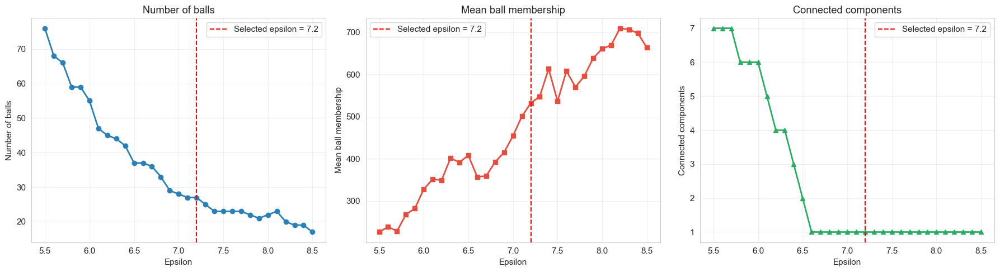

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].plot(eps_df["eps"], eps_df["n_balls"], marker="o", color="#2980b9", lw=2)
axes[0].axvline(EPS_MAIN, color="red", linestyle="--", lw=1.5, label=f"Selected epsilon = {EPS_MAIN}")
axes[0].set_xlabel("Epsilon")
axes[0].set_ylabel("Number of balls")
axes[0].set_title("Number of balls")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(eps_df["eps"], eps_df["avg_ball_size"], marker="s", color="#e74c3c", lw=2)
axes[1].axvline(EPS_MAIN, color="red", linestyle="--", lw=1.5, label=f"Selected epsilon = {EPS_MAIN}")
axes[1].set_xlabel("Epsilon")
axes[1].set_ylabel("Mean ball membership")
axes[1].set_title("Mean ball membership")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

axes[2].plot(eps_df["eps"], eps_df["n_components"], marker="^", color="#27ae60", lw=2)
axes[2].axvline(EPS_MAIN, color="red", linestyle="--", lw=1.5, label=f"Selected epsilon = {EPS_MAIN}")
axes[2].set_xlabel("Epsilon")
axes[2].set_ylabel("Connected components")
axes[2].set_title("Connected components")
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(FIG_DIR / "area_tdabm_pyballmapper_R1_epsilon_sensitivity.png", dpi=150, bbox_inches="tight", facecolor="white")
plt.show()


## 4. Build and recolour the main area graph

Build one graph at `EPS_MAIN` and reuse its memberships, edges, node sizes and spring layout for every colouring. Export complete-withdrawal and retained-provision shares, followed by 30 census colour maps.

In [9]:
# Minimum and maximum node areas.
NODE_SIZE_MIN = 300
NODE_SIZE_MAX = 3500


Main pyballmapper BM: {'eps': 7.2, 'n_balls': 27, 'n_edges': 164, 'n_components': 1, 'avg_ball_size': 532.074074074074, 'max_ball_size': 3343, 'avg_overlaps': 3.5056124938994633}


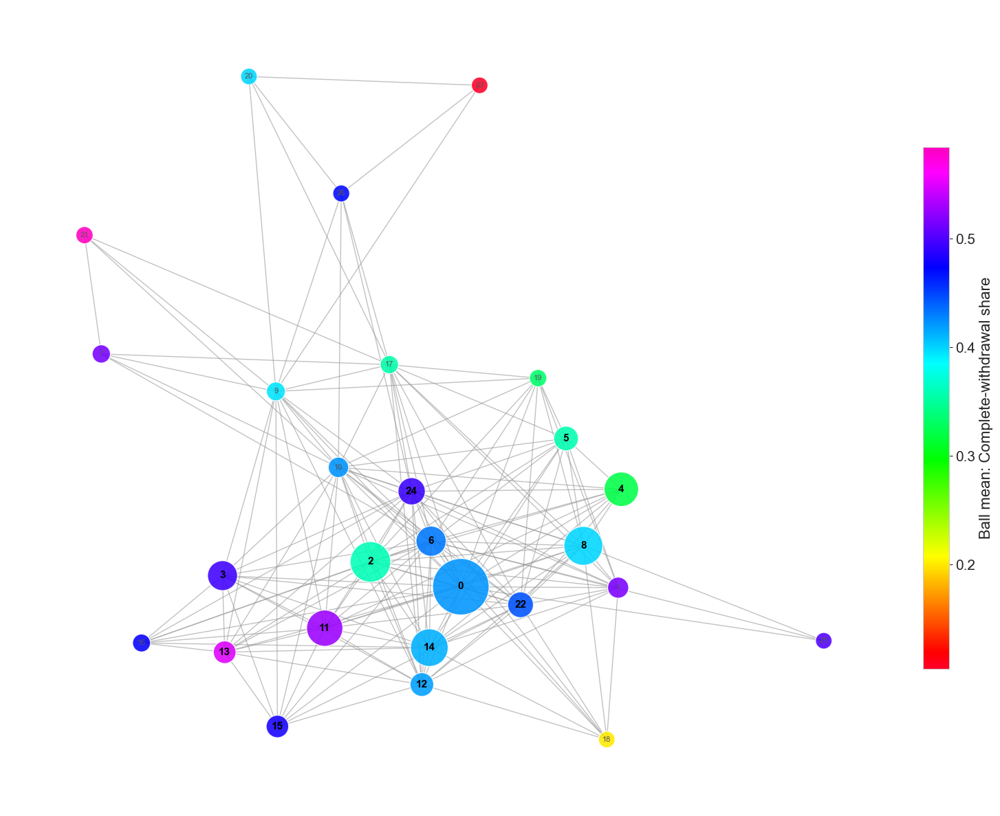

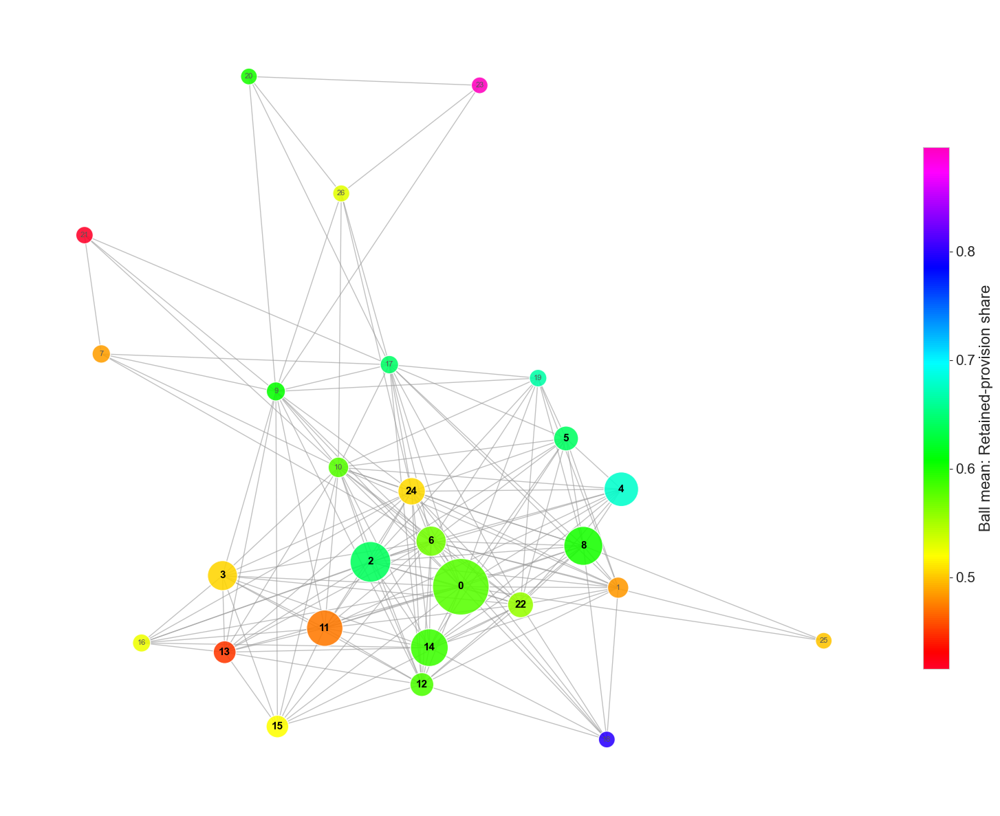

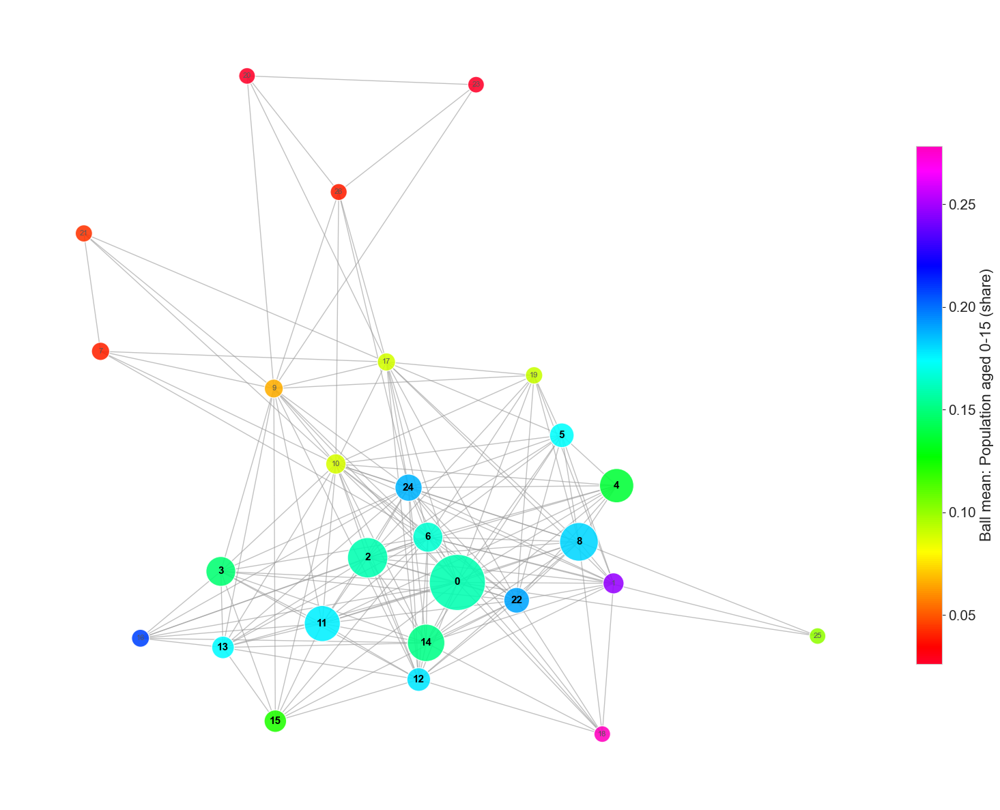

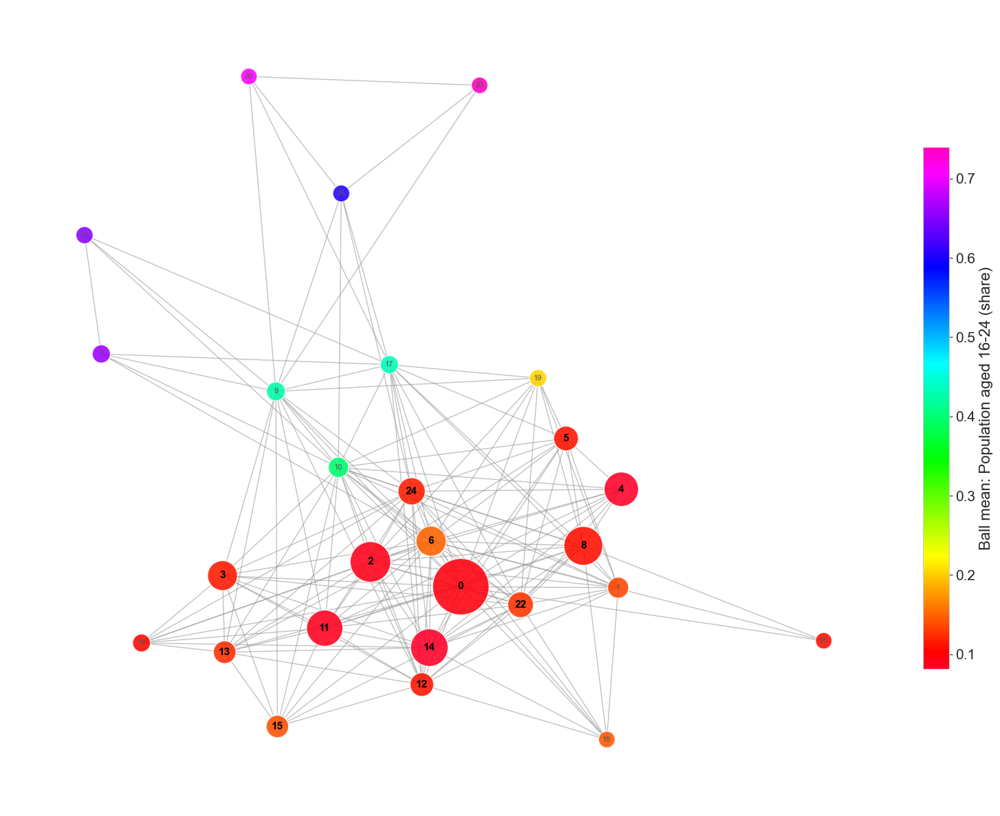

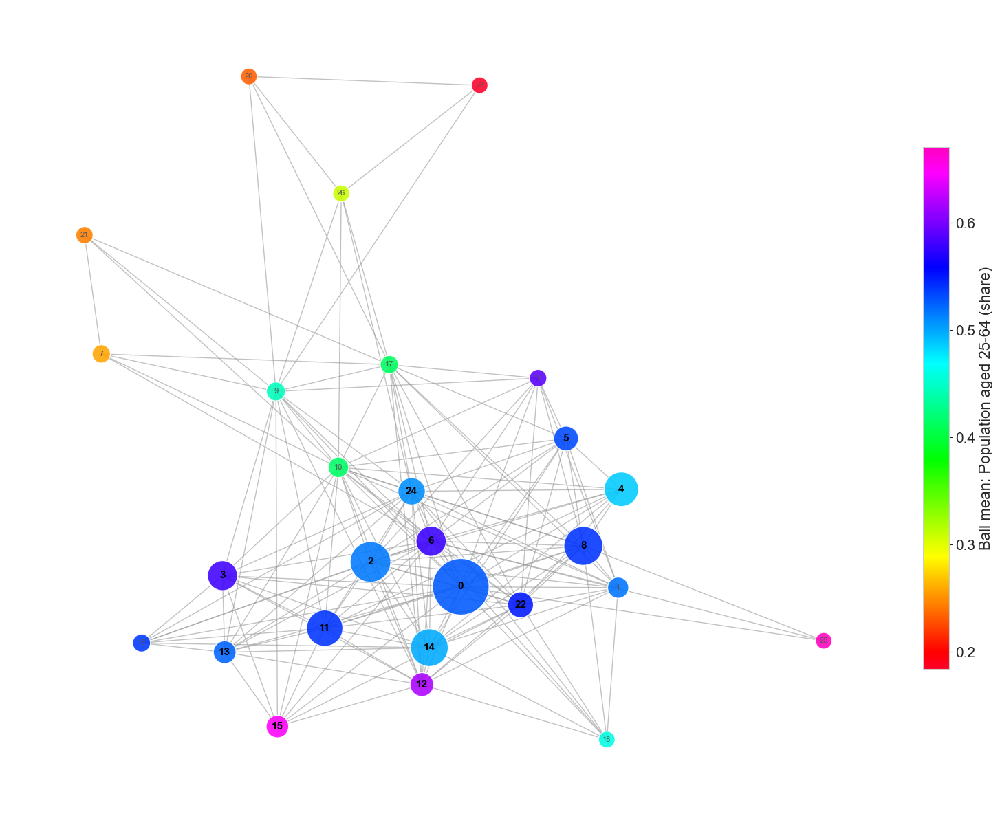

...

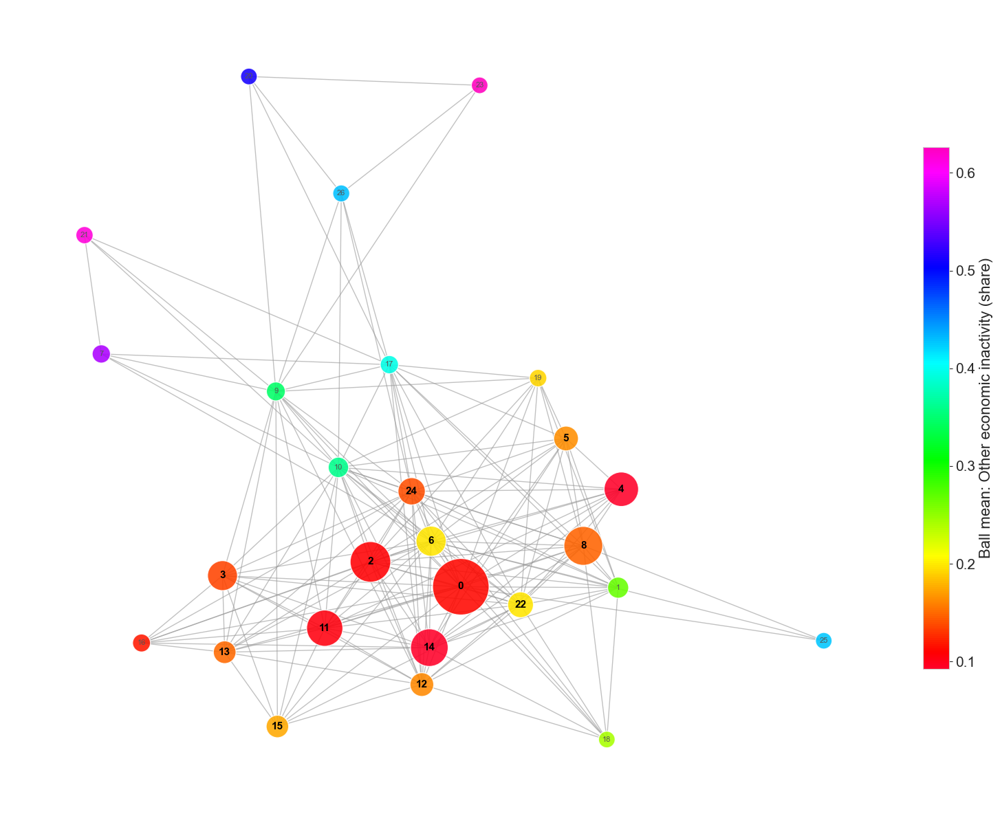

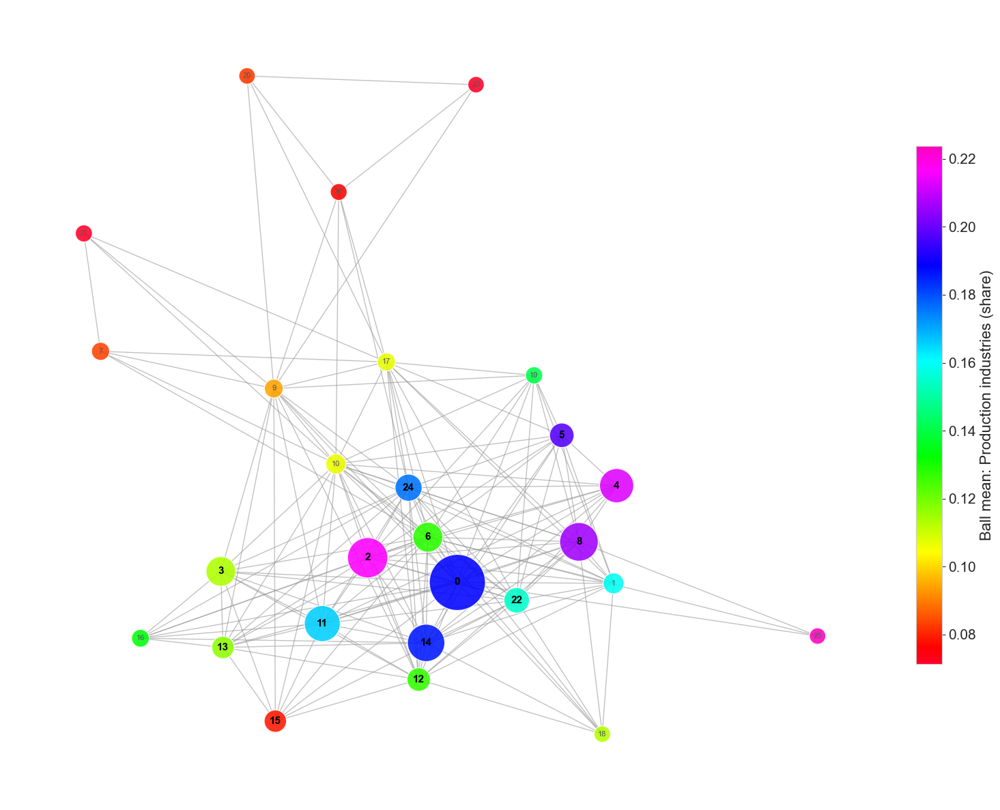

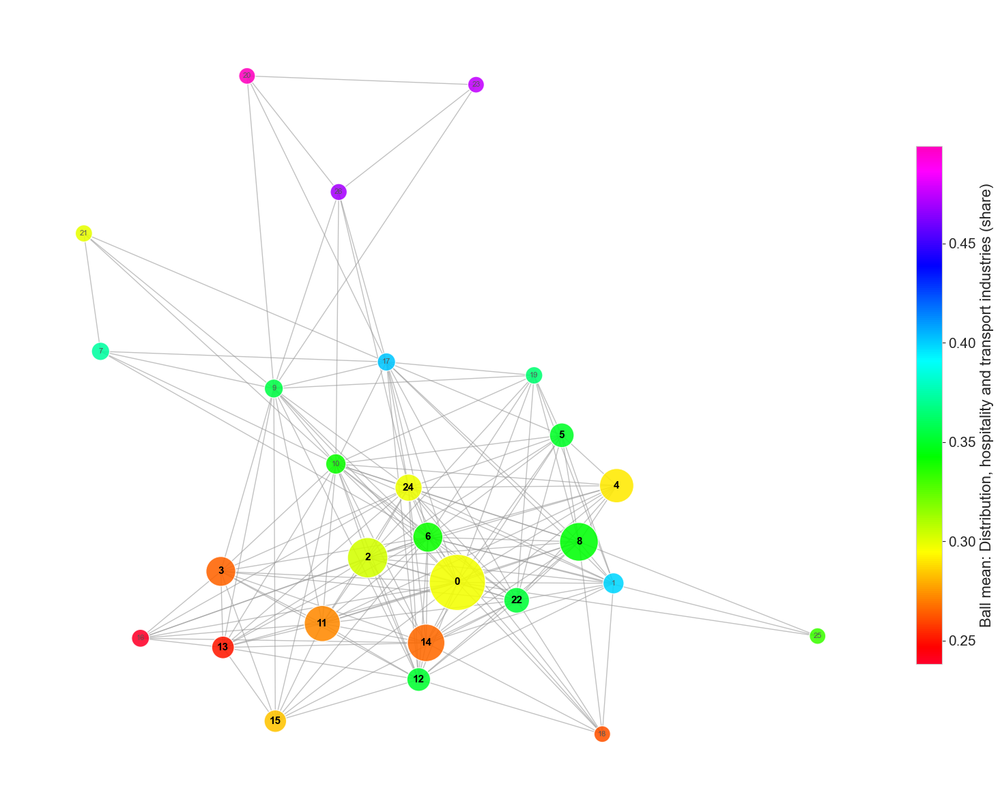

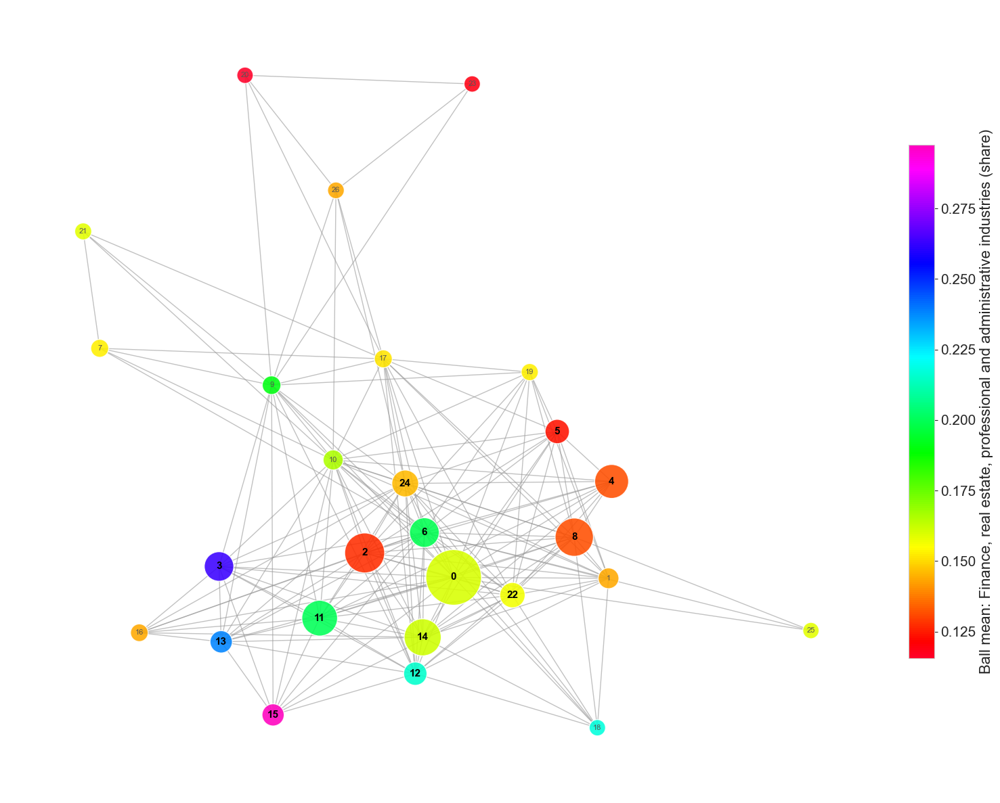

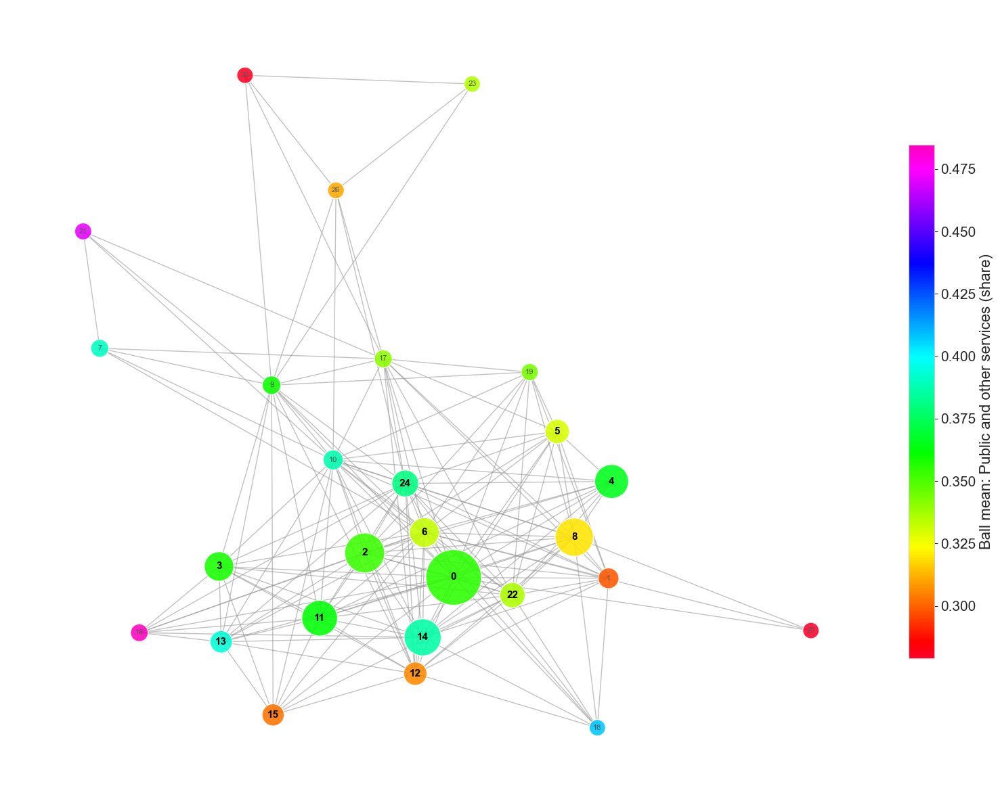

In [10]:
# Reuse one graph and layout for all colour variables.
main_bm = build_pbm(X, EPS_MAIN)
main_pos = nx.spring_layout(main_bm.Graph, k=0.75, scale=3.0, seed=SEED)
print("Main pyballmapper BM:", bm_stats_pbm(X, EPS_MAIN))

for var in COLOR_VARS:
    label = COLOR_LABELS[var]
    draw_pbm_custom(
        bm_df, X, EPS_MAIN, var,
        colorbar_label=f"Ball mean: {label}",
        filename=f"area_tdabm_pyballmapper_colour_{var}.png",
        pos=main_pos,
        bm=main_bm,
    )


## 5. Export the ball-level summary

Export one row per ball with membership count, complete-withdrawal mean and selected census means. Interpret outcome means alongside `n_rows`, especially for small balls. 
Use this summary to check numerical claims suggested by the colours and to identify balls for closer inspection. 

In [11]:
membership = points_and_balls_df(main_bm).rename(columns={"point": "_point"})
summary_base = pd.DataFrame({
    "_point": np.arange(len(bm_df), dtype=int),
    ID_COL: bm_df[ID_COL].to_numpy(),
    SPLIT_VAR: get_numeric_series(bm_df, SPLIT_VAR).to_numpy(),
})
for c in ["cars_0_pct", "age_65_plus_pct", "health_bad_very_bad_pct", "education_no_qualifications_pct"]:
    if c in bm_df.columns:
        summary_base[c] = get_numeric_series(bm_df, c).to_numpy()

merged = summary_base.merge(membership, on="_point", how="inner")
agg = {ID_COL: "count", SPLIT_VAR: "mean"}
for c in ["cars_0_pct", "age_65_plus_pct", "health_bad_very_bad_pct", "education_no_qualifications_pct"]:
    if c in merged.columns:
        agg[c] = "mean"
ball_summary = merged.groupby("ball", sort=True).agg(agg).rename(columns={ID_COL: "n_rows", SPLIT_VAR: f"{SPLIT_VAR}_mean"})
display(ball_summary.sort_values(f"{SPLIT_VAR}_mean", ascending=False).head(20))
ball_summary.to_csv(TABLE_DIR / "area_tdabm_pyballmapper_ball_summary.csv")


,n_rows,complete_withdrawal_mean,cars_0_pct,age_65_plus_pct,health_bad_very_bad_pct,education_no_qualifications_pct
ball,,,,,,
21,29,0.620690,0.424042,0.057093,0.023349,0.046279
13,278,0.550360,0.249657,0.179700,0.032964,0.097483
11,1196,0.526756,0.196911,0.195137,0.039580,0.132342
1,198,0.515152,0.428064,0.099660,0.064480,0.298686
7,70,0.514286,0.510870,0.041525,0.023563,0.052894
25,2,0.500000,0.195933,0.095710,0.072419,0.215287
3,718,0.495822,0.340095,0.158818,0.034375,0.097527
24,542,0.492620,0.260469,0.188612,0.058750,0.187352
15,269,0.479554,0.620200,0.089810,0.032973,0.092676


### 5.1 Select any number of balls and inspect all memberships

Set `SELECTED_BALLS` to inspect memberships. Overlapping observations appear once per selected ball; the next block removes repeats.

The membership table retains the connection between each observation and its ball identifier. This is useful for checking which profiles share observations and for inspecting the characteristics of the selected groups.


In [12]:
# Select existing ball numbers.
SELECTED_BALLS = [1, 11, 13, 21]

selected_balls = list(dict.fromkeys(int(ball) for ball in SELECTED_BALLS))
if not selected_balls:
    raise ValueError("SELECTED_BALLS must contain at least one ball number.")
available_balls = {int(ball) for ball in main_bm.Graph.nodes}
missing_balls = sorted(set(selected_balls) - available_balls)
if missing_balls:
    raise ValueError(f"Ball numbers not present in the main graph: {missing_balls}")

# Retain overlaps until the next block.
selected_memberships = (
    points_and_balls_df(main_bm)
    .loc[lambda x: x["ball"].isin(selected_balls), ["point", "ball"]]
    .rename(columns={"point": "_point", "ball": "source_ball"})
)
point_lookup = pd.DataFrame({
    "_point": np.arange(len(bm_df), dtype=int),
    ID_COL: bm_df[ID_COL].to_numpy(),
})
town_lookup = (
    pd.read_csv(DATA_DIR / "eda_bank_level.csv", usecols=["area_code", "town"], low_memory=False)
    .dropna(subset=["area_code", "town"])
    .assign(town=lambda x: x["town"].astype("string").str.strip().replace("", pd.NA))
    .dropna(subset=["town"])
    .drop_duplicates(["area_code", "town"])
    .sort_values(["area_code", "town"])
    .groupby("area_code", as_index=False)["town"].agg(" | ".join)
    .rename(columns={"town": "city_or_town"})
)
area_selected_ball_memberships = (
    selected_memberships
    .merge(point_lookup, on="_point", how="left", validate="many_to_one")
    .merge(df, on=ID_COL, how="left", validate="many_to_one")
    .merge(town_lookup, on="area_code", how="left", validate="many_to_one")
)

print(f"Selected balls: {selected_balls}")
print(f"Membership rows before overlap removal: {len(area_selected_ball_memberships):,}")
display(
    area_selected_ball_memberships.groupby("source_ball", sort=False)
    .agg(memberships=(ID_COL, "size"), unique_areas=(ID_COL, "nunique"))
)
display(
    area_selected_ball_memberships[[
        "source_ball", "area_code", "area_name", "city_or_town", "country",
        "complete_withdrawal", "retained_provision",
    ]].sort_values(["source_ball", "country", "city_or_town", "area_name"], na_position="last").head(100)
)


Selected balls: [1, 11, 13, 21]
Membership rows before overlap removal: 1,701


,memberships,unique_areas
source_ball,,
1,198,198
11,1196,1196
13,278,278
21,29,29


,source_ball,area_code,area_name,city_or_town,country,complete_withdrawal,retained_provision
80,1,E01025041,Hyndburn 006A,Accrington,England,1,0
72,1,E01005948,Tameside 013A,Ashton Under Lyne,England,0,1
66,1,E01017663,Buckinghamshire 015C,Aylesbury,England,1,0
10,1,E01011015,Kirklees 010A,Batley,England,0,1
156,1,E01011029,Kirklees 010B,Batley,England,0,1
183,1,E01009128,Birmingham 011B,Birmingham,England,0,1
68,1,E01009131,Birmingham 011D,Birmingham,England,0,1
50,1,E01009137,Birmingham 011G,Birmingham,England,1,0
115,1,E01009242,Birmingham 024E,Birmingham,England,0,1
158,1,E01009051,Birmingham 033A,Birmingham,England,0,1


### 5.2 Keep each observation once and save the selected-ball data

Store all selected ball identifiers in `ball_memberships`, retain one row per source observation, and save the unique table.


In [13]:
# Collapse overlapping ball memberships to one row per original area observation.
area_membership_map = (
    area_selected_ball_memberships.groupby(ID_COL, sort=False)["source_ball"]
    .agg(lambda values: ";".join(map(str, sorted(set(values)))))
    .rename("ball_memberships")
)
area_level_chosed_ball = (
    area_selected_ball_memberships.sort_values([ID_COL, "source_ball"])
    .drop_duplicates(ID_COL, keep="first")
    .drop(columns="source_ball")
    .merge(area_membership_map, left_on=ID_COL, right_index=True, how="left", validate="one_to_one")
)
area_level_chosed_ball["selected_ball_count"] = (
    area_level_chosed_ball["ball_memberships"].str.count(";") + 1
)
area_level_chosed_ball["shared_between_selected_balls"] = (
    area_level_chosed_ball["selected_ball_count"] > 1
)

front_columns = [
    "ball_memberships", "selected_ball_count", "shared_between_selected_balls",
    "area_code", "area_name", "city_or_town", "country", "geography_type",
    "census_year", "complete_withdrawal", "retained_provision",
]
area_level_chosed_ball = area_level_chosed_ball[
    [column for column in front_columns if column in area_level_chosed_ball.columns]
    + [column for column in area_level_chosed_ball.columns if column not in front_columns]
]

area_output_file = TABLE_DIR / "area level chosed ball.csv"
area_level_chosed_ball.to_csv(area_output_file, index=False)
assert not area_level_chosed_ball[ID_COL].duplicated().any()
print(f"Unique area observations: {len(area_level_chosed_ball):,}")
print(f"Observations shared by selected balls: {area_level_chosed_ball['shared_between_selected_balls'].sum():,}")
print(f"Saved unique data: {area_output_file}")
display(area_level_chosed_ball[front_columns].head(100))


Unique area observations: 1,470
Observations shared by selected balls: 231
Saved unique data: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\results\tdabm_tables\area level chosed ball.csv


,ball_memberships,selected_ball_count,shared_between_selected_balls,area_code,area_name,city_or_town,country,geography_type,census_year,complete_withdrawal,retained_provision
31,1,1,False,E01000013,Barking and Dagenham 013A,London,England,LSOA,2021,0,1
140,1,1,False,E01000032,Barking and Dagenham 002B,London,England,LSOA,2021,1,0
14,1,1,False,E01000085,Barking and Dagenham 013E,London,England,LSOA,2021,0,1
155,1,1,False,E01000105,Barking and Dagenham 014C,London,England,LSOA,2021,1,0
100,1,1,False,E01000129,Barnet 024D,London,England,LSOA,2021,1,0
949,11,1,False,E01000174,Barnet 006D,London,England,LSOA,2021,1,0
677,11;13,2,True,E01000181,Barnet 029D,London,England,LSOA,2021,1,0
382,11;13,2,True,E01000192,Barnet 018A,London,England,LSOA,2021,0,1
335,11,1,False,E01000193,Barnet 018B,London,England,LSOA,2021,0,1
466,11;13,2,True,E01000194,Barnet 018C,London,England,LSOA,2021,0,1


## 6. Robustness checks

The following checks examine whether the main topological interpretation persists when the variable set, radius, or landmark order changes.

## 6.1 Reduced-variable robustness and radius selection

Retain 15 indicators and the main analytical sample. Rescan epsilon from 3.5 to 5.5 in steps of 0.1, using 80%-120% of the main ball count as a resolution guide. 

A new scan is needed because reducing the number of standardised coordinates changes the distance scale. The ball-count band helps compare maps at a similar level of detail, while allowing their memberships and connections to change.


Reduced scan 01/21 | eps=3.5 | balls=51 | difference=+24 | within +/-20%=False
Reduced scan 02/21 | eps=3.6 | balls=46 | difference=+19 | within +/-20%=False
Reduced scan 03/21 | eps=3.7 | balls=42 | difference=+15 | within +/-20%=False
Reduced scan 04/21 | eps=3.8 | balls=37 | difference=+10 | within +/-20%=False
Reduced scan 05/21 | eps=3.9 | balls=32 | difference=+5 | within +/-20%=True
Reduced scan 06/21 | eps=4.0 | balls=30 | difference=+3 | within +/-20%=True
Reduced scan 07/21 | eps=4.1 | balls=29 | difference=+2 | within +/-20%=True
Reduced scan 08/21 | eps=4.2 | balls=26 | difference=-1 | within +/-20%=True
Reduced scan 09/21 | eps=4.3 | balls=24 | difference=-3 | within +/-20%=True
Reduced scan 10/21 | eps=4.4 | balls=24 | difference=-3 | within +/-20%=True
Reduced scan 11/21 | eps=4.5 | balls=22 | difference=-5 | within +/-20%=True
Reduced scan 12/21 | eps=4.6 | balls=22 | difference=-5 | within +/-20%=True
Reduced scan 13/21 | eps=4.7 | balls=18 | difference=-9 | within +/-

,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
0,3.5,51,298,2,247.098039,2211,3.075159,24,1.888889,False
1,3.6,46,281,1,298.456522,2304,3.350171,19,1.703704,False
2,3.7,42,245,1,333.142857,2397,3.414348,15,1.555556,False
3,3.8,37,222,1,393.567568,2478,3.553441,10,1.370370,False
4,3.9,32,158,1,428.031250,2558,3.342362,5,1.185185,True
5,4.0,30,139,1,415.766667,2642,3.043680,3,1.111111,True
6,4.1,29,157,1,446.758621,2712,3.161542,2,1.074074,True
7,4.2,26,139,1,508.115385,2775,3.223768,-1,0.962963,True
8,4.3,24,119,1,532.291667,2845,3.117374,-3,0.888889,True
9,4.4,24,113,1,558.833333,2919,3.272816,-3,0.888889,True


Reduced-variable candidate radii within +/-20% of the main ball count:


,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
4,3.9,32,158,1,428.031250,2558,3.342362,5,1.185185,True
5,4.0,30,139,1,415.766667,2642,3.043680,3,1.111111,True
6,4.1,29,157,1,446.758621,2712,3.161542,2,1.074074,True
7,4.2,26,139,1,508.115385,2775,3.223768,-1,0.962963,True
8,4.3,24,119,1,532.291667,2845,3.117374,-3,0.888889,True
9,4.4,24,113,1,558.833333,2919,3.272816,-3,0.888889,True
10,4.5,22,105,1,644.636364,2983,3.460713,-5,0.814815,True
11,4.6,22,108,1,604.409091,3048,3.244754,-5,0.814815,True


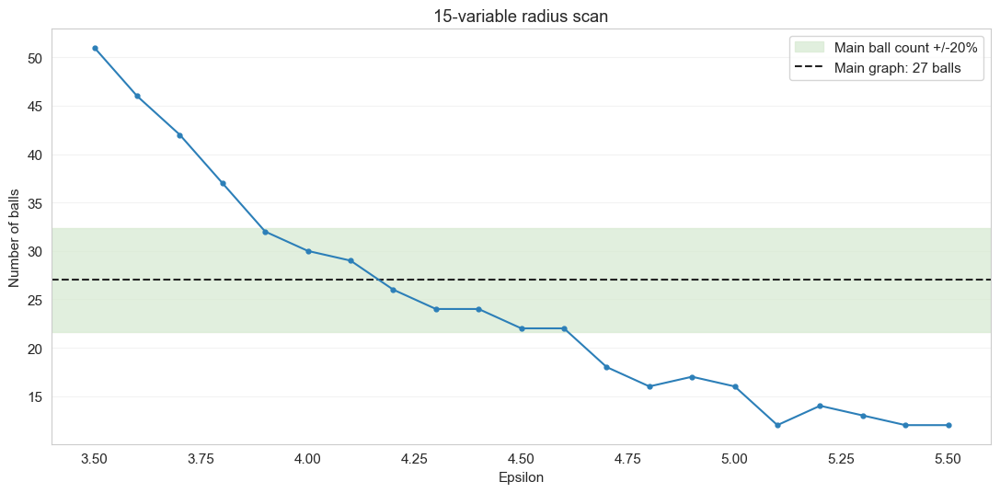

In [14]:
REDUCED_FEATURES = [
    "age_16_24_pct", "age_65_plus_pct", "deprived_2_plus_pct", "cars_0_pct",
    "health_other_pct", "disabled_pct", "education_low_pct", "education_higher_pct",
    "nssec_managerial_professional_small_employers_pct", "nssec_semi_routine_routine_pct",
    "nssec_never_worked_long_term_unemployed_pct", "unemployed_pct", "inactive_retired_pct",
    "industry_production_pct", "industry_finance_real_estate_professional_admin_pct",
]
assert len(REDUCED_FEATURES) == 15


# Keep exactly the observations used by the 30-variable main graph.
X_reduced = StandardScaler().fit_transform(bm_df[REDUCED_FEATURES])
MAIN_BALL_COUNT = main_bm.Graph.number_of_nodes()
BALL_COUNT_MIN = 0.80 * MAIN_BALL_COUNT
BALL_COUNT_MAX = 1.20 * MAIN_BALL_COUNT

REDUCED_EPS_MIN = 3.5
REDUCED_EPS_MAX = 5.5
reduced_eps_values = np.round(np.arange(REDUCED_EPS_MIN, REDUCED_EPS_MAX + 0.001, 0.1), 1)
reduced_records = []
for scan_number, eps in enumerate(reduced_eps_values, start=1):
    rec = bm_stats_pbm(X_reduced, eps)
    rec["ball_count_difference"] = rec["n_balls"] - MAIN_BALL_COUNT
    rec["ball_count_ratio"] = rec["n_balls"] / MAIN_BALL_COUNT
    rec["within_main_20pct"] = 0.80 <= rec["ball_count_ratio"] <= 1.20
    reduced_records.append(rec)
    print(
        f"Reduced scan {scan_number:02d}/{len(reduced_eps_values)} | eps={eps:.1f} | "
        f"balls={rec['n_balls']} | difference={rec['ball_count_difference']:+d} | "
        f"within +/-20%={rec['within_main_20pct']}"
    )

reduced_eps_df = pd.DataFrame(reduced_records)
reduced_eps_df.to_csv(
    TABLE_DIR / "area_tdabm_reduced_variables_epsilon_scan.csv", index=False
)
display(reduced_eps_df)
print("Reduced-variable candidate radii within +/-20% of the main ball count:")
display(reduced_eps_df.loc[reduced_eps_df["within_main_20pct"]])

fig, ax = plt.subplots(figsize=(11, 5.5))
ax.axhspan(BALL_COUNT_MIN, BALL_COUNT_MAX, color="#d8ead3", alpha=0.75, label="Main ball count +/-20%")
ax.axhline(MAIN_BALL_COUNT, color="#222222", linestyle="--", linewidth=1.5, label=f"Main graph: {MAIN_BALL_COUNT} balls")
ax.plot(reduced_eps_df["eps"], reduced_eps_df["n_balls"], color="#2c7fb8", marker="o", markersize=3.5)
ax.set(xlabel="Epsilon", ylabel="Number of balls", title="15-variable radius scan")
ax.legend(frameon=True)
ax.grid(axis="y", alpha=0.25)
ax.grid(axis="x", visible=False)
plt.tight_layout()
plt.savefig(FIG_DIR / "area_tdabm_reduced_variables_epsilon_scan.png", dpi=180, bbox_inches="tight", facecolor="white")
plt.show()


### Set the reduced-variable radius and draw its outcome map

The reported reduced-variable graph uses `EPS_REDUCED_MANUAL = 4.0`. Edit only this value after inspecting the scan. The cell warns when the chosen radius lies outside the suggested ball-count range.


,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
5,4.0,30,139,1,415.766667,2642,3.04368,3,1.111111,True


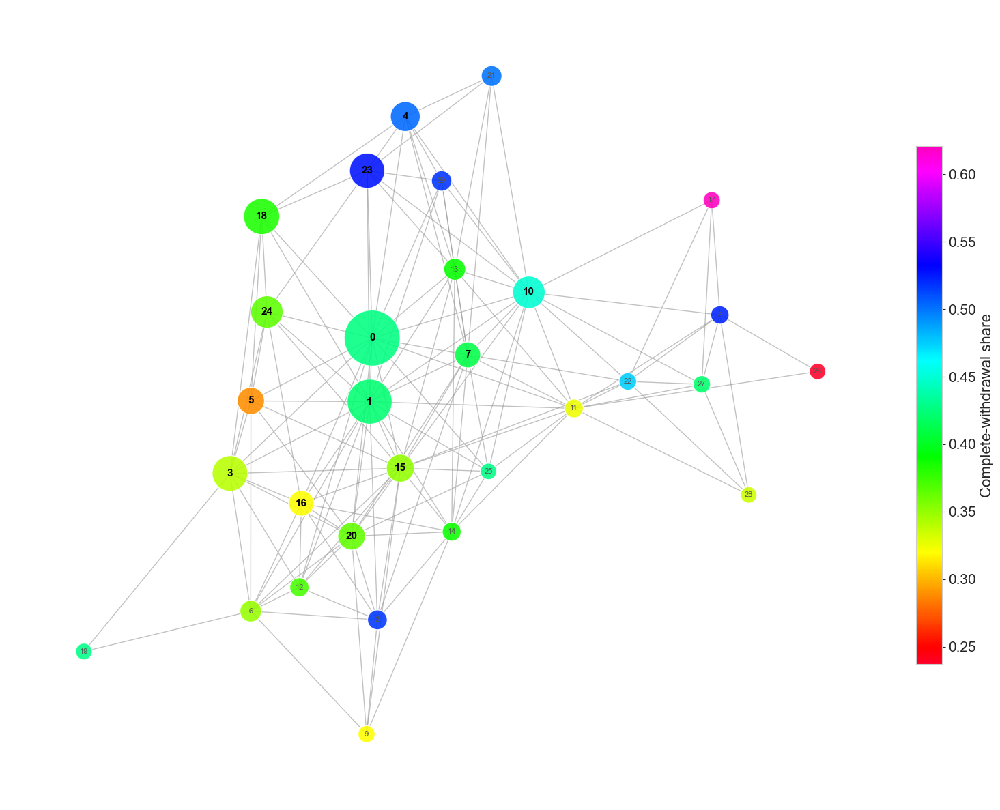

(<pyballmapper.ballmapper.BallMapper at 0x22088ffde80>,
 {0: array([-0.17770636,  0.09541106]),
  1: array([-0.18438014, -0.00970281]),
  2: array([-0.16388762, -0.37047079]),
  3: array([-0.55351606, -0.12839222]),
  4: array([-0.09003845,  0.46173567]),
  5: array([-0.49831583, -0.00838156]),
  6: array([-0.49874693, -0.35606476]),
  7: array([0.07488332, 0.06763389]),
  8: array([0.741704 , 0.1336224]),
  9: array([-0.19260691, -0.55930645]),
  10: array([0.23665518, 0.1710726 ]),
  11: array([ 0.35581164, -0.02088997]),
  12: array([-0.37016086, -0.31669051]),
  13: array([0.0406608 , 0.20913673]),
  14: array([ 0.03259181, -0.22472384]),
  15: array([-0.10321931, -0.11976332]),
  16: array([-0.36493373, -0.17771667]),
  17: array([0.72008801, 0.32327919]),
  18: array([-0.46989611,  0.2964194 ]),
  19: array([-0.93999648, -0.42281451]),
  20: array([-0.23202615, -0.23220666]),
  21: array([0.13808542, 0.52879599]),
  22: array([0.49829702, 0.02373975]),
  23: array([-0.19095614,  

In [15]:
# Select the radius after inspecting the scan.
EPS_REDUCED_MANUAL = 4.0

reduced_choice = reduced_eps_df.loc[np.isclose(reduced_eps_df["eps"], EPS_REDUCED_MANUAL)]
if reduced_choice.empty:
    raise ValueError("EPS_REDUCED_MANUAL must be inside REDUCED_EPS_MIN--REDUCED_EPS_MAX in steps of 0.1.")
display(reduced_choice)
if not bool(reduced_choice["within_main_20pct"].iloc[0]):
    print("Warning: this radius produces a ball count outside the main graph +/-20% range.")

reduced_bm = build_pbm(X_reduced, EPS_REDUCED_MANUAL)
reduced_pos = nx.spring_layout(reduced_bm.Graph, k=0.1, scale=1.0, seed=SEED)
draw_pbm_custom(
    bm_df, X_reduced, EPS_REDUCED_MANUAL, SPLIT_VAR,
    colorbar_label="Complete-withdrawal share",
    filename="area_tdabm_reduced_variables_outcome.png",
    pos=reduced_pos, bm=reduced_bm,
)


## 6.2 Expanded-variable robustness and radius selection

The expanded specification separates the broad Census groups into 49 available components. The radius is rescanned from 8.5 to 10.5 in steps of 0.1 and judged against the same main-graph ball-count band.


Expanded scan 01/21 | eps=8.5 | balls=50 | difference=+23 | within +/-20%=False
Expanded scan 02/21 | eps=8.6 | balls=47 | difference=+20 | within +/-20%=False
Expanded scan 03/21 | eps=8.7 | balls=44 | difference=+17 | within +/-20%=False
Expanded scan 04/21 | eps=8.8 | balls=41 | difference=+14 | within +/-20%=False
Expanded scan 05/21 | eps=8.9 | balls=39 | difference=+12 | within +/-20%=False
Expanded scan 06/21 | eps=9.0 | balls=37 | difference=+10 | within +/-20%=False
Expanded scan 07/21 | eps=9.1 | balls=38 | difference=+11 | within +/-20%=False
Expanded scan 08/21 | eps=9.2 | balls=37 | difference=+10 | within +/-20%=False
Expanded scan 09/21 | eps=9.3 | balls=36 | difference=+9 | within +/-20%=False
Expanded scan 10/21 | eps=9.4 | balls=36 | difference=+9 | within +/-20%=False
Expanded scan 11/21 | eps=9.5 | balls=34 | difference=+7 | within +/-20%=False
Expanded scan 12/21 | eps=9.6 | balls=33 | difference=+6 | within +/-20%=False
Expanded scan 13/21 | eps=9.7 | balls=34 | d

,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
0,8.5,50,371,3,317.720000,3176,3.876525,23,1.851852,False
1,8.6,47,309,3,307.489362,3214,3.526598,20,1.740741,False
2,8.7,44,289,3,324.931818,3247,3.488775,17,1.629630,False
3,8.8,41,242,3,325.292683,3269,3.254514,14,1.518519,False
4,8.9,39,245,3,374.410256,3300,3.563202,12,1.444444,False
5,9.0,37,213,3,359.945946,3336,3.249878,10,1.370370,False
6,9.1,38,247,3,369.552632,3377,3.426794,11,1.407407,False
7,9.2,37,249,3,395.972973,3402,3.575159,10,1.370370,False
8,9.3,36,215,3,381.055556,3435,3.347487,9,1.333333,False
9,9.4,36,232,2,403.027778,3469,3.540508,9,1.333333,False


Expanded-variable candidate radii within +/-20% of the main ball count:


,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
13,9.8,30,169,2,413.833333,3584,3.029527,3,1.111111,True
14,9.9,32,204,2,456.281250,3604,3.562958,5,1.185185,True
15,10.0,30,190,2,470.866667,3626,3.447047,3,1.111111,True
16,10.1,30,197,2,517.133333,3645,3.785749,3,1.111111,True
17,10.2,28,174,2,514.642857,3671,3.516349,1,1.037037,True
18,10.3,26,149,2,521.230769,3693,3.306979,-1,0.962963,True
19,10.4,26,164,2,578.384615,3709,3.669595,-1,0.962963,True
20,10.5,26,170,2,581.576923,3730,3.689849,-1,0.962963,True


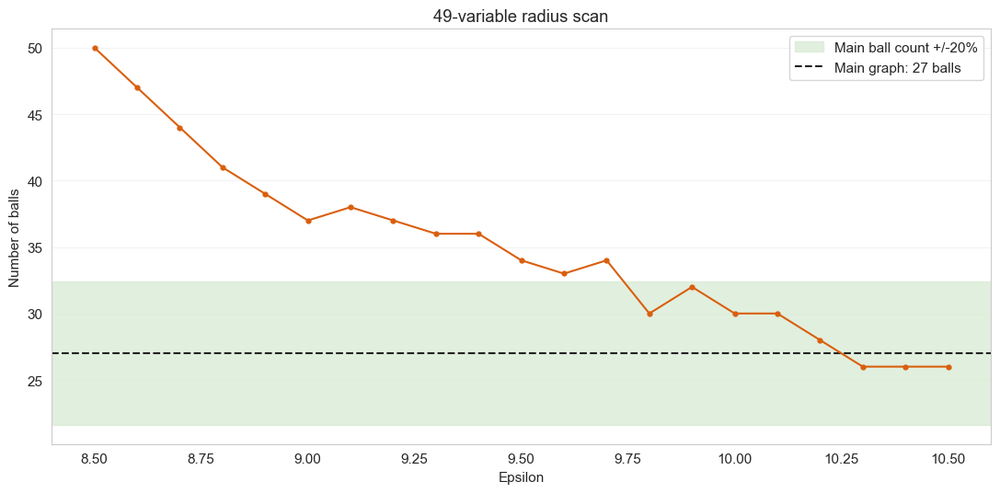

In [16]:
EXPANDED_FEATURES = [
    "age_0_15_pct", "age_16_24_pct", "age_25_34_pct", "age_35_49_pct", "age_50_64_pct", "age_65_plus_pct",
    "deprived_0_pct", "deprived_1_pct", "deprived_2_plus_pct",
    "cars_0_pct", "cars_1_pct", "cars_2_pct", "cars_3_plus_pct",
    "health_very_good_pct", "health_good_pct", "health_fair_pct", "health_bad_pct", "health_very_bad_pct", "disabled_pct",
    "education_no_qualifications_pct", "education_l1_only_pct", "education_apprenticeship_pct",
    "education_l2_only_pct", "education_higher_pct",
    "nssec_managerial_professional_pct", "nssec_intermediate_pct", "nssec_small_employers_own_account_pct",
    "nssec_lower_supervisory_technical_pct", "nssec_semi_routine_routine_pct",
    "nssec_never_worked_long_term_unemployed_pct", "nssec_full_time_students_pct",
    "employee_part_time_pct", "employee_full_time_pct", "self_employed_part_time_pct", "self_employed_full_time_pct",
    "unemployed_pct", "inactive_retired_pct", "inactive_student_pct", "inactive_home_family_pct",
    "inactive_long_term_sick_disabled_pct", "inactive_other_pct",
    "industry_agriculture_energy_water_pct", "industry_manufacturing_pct", "industry_construction_pct",
    "industry_distribution_hotels_restaurants_pct", "industry_transport_communication_pct",
    "industry_finance_real_estate_professional_admin_pct", "industry_public_admin_education_health_pct", "industry_other_pct",
]
assert len(EXPANDED_FEATURES) == 49


# Recover the detailed shares in the same observation order as the main graph.
expanded_frame = (
    df.set_index(ID_COL)
    .reindex(bm_df[ID_COL])
    .loc[:, EXPANDED_FEATURES]
    .replace([np.inf, -np.inf], np.nan)
)
if expanded_frame.isna().any().any():
    missing_rows = int(expanded_frame.isna().any(axis=1).sum())
    raise ValueError(f"Expanded variables contain missing values for {missing_rows} main-sample observations.")
X_expanded = StandardScaler().fit_transform(expanded_frame)

EXPANDED_EPS_MIN = 8.5
EXPANDED_EPS_MAX = 10.5
expanded_eps_values = np.round(np.arange(EXPANDED_EPS_MIN, EXPANDED_EPS_MAX + 0.001, 0.1), 1)
expanded_records = []
for scan_number, eps in enumerate(expanded_eps_values, start=1):
    rec = bm_stats_pbm(X_expanded, eps)
    rec["ball_count_difference"] = rec["n_balls"] - MAIN_BALL_COUNT
    rec["ball_count_ratio"] = rec["n_balls"] / MAIN_BALL_COUNT
    rec["within_main_20pct"] = 0.80 <= rec["ball_count_ratio"] <= 1.20
    expanded_records.append(rec)
    print(
        f"Expanded scan {scan_number:02d}/{len(expanded_eps_values)} | eps={eps:.1f} | "
        f"balls={rec['n_balls']} | difference={rec['ball_count_difference']:+d} | "
        f"within +/-20%={rec['within_main_20pct']}"
    )

expanded_eps_df = pd.DataFrame(expanded_records)
expanded_eps_df.to_csv(
    TABLE_DIR / "area_tdabm_expanded_variables_epsilon_scan.csv", index=False
)
display(expanded_eps_df)
print("Expanded-variable candidate radii within +/-20% of the main ball count:")
display(expanded_eps_df.loc[expanded_eps_df["within_main_20pct"]])

fig, ax = plt.subplots(figsize=(11, 5.5))
ax.axhspan(BALL_COUNT_MIN, BALL_COUNT_MAX, color="#d8ead3", alpha=0.75, label="Main ball count +/-20%")
ax.axhline(MAIN_BALL_COUNT, color="#222222", linestyle="--", linewidth=1.5, label=f"Main graph: {MAIN_BALL_COUNT} balls")
ax.plot(expanded_eps_df["eps"], expanded_eps_df["n_balls"], color="#d95f0e", marker="o", markersize=3.5)
ax.set(xlabel="Epsilon", ylabel="Number of balls", title="49-variable radius scan")
ax.legend(frameon=True)
ax.grid(axis="y", alpha=0.25)
ax.grid(axis="x", visible=False)
plt.tight_layout()
plt.savefig(FIG_DIR / "area_tdabm_expanded_variables_epsilon_scan.png", dpi=180, bbox_inches="tight", facecolor="white")
plt.show()


### Set the expanded-variable radius and draw its outcome map

The reported expanded-variable graph uses `EPS_EXPANDED_MANUAL = 10.3`. 


,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
18,10.3,26,149,2,521.230769,3693,3.306979,-1,0.962963,True


Selected comparison: 26 expanded-variable balls versus 27 main balls (-3.7%).


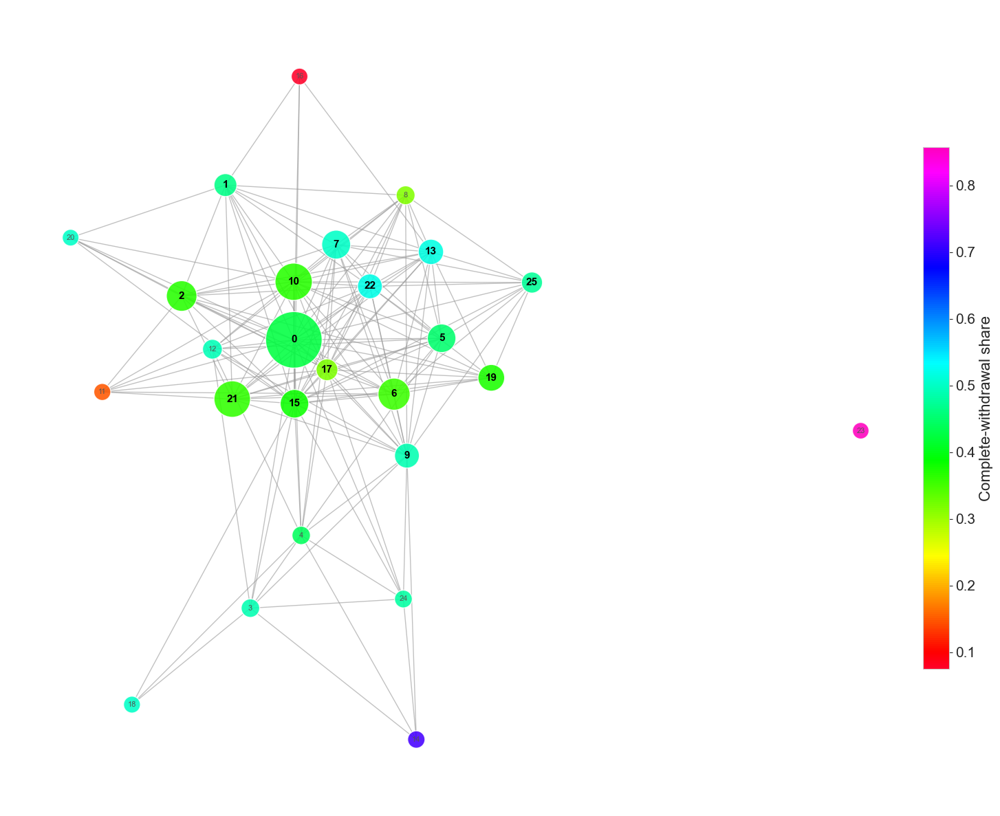

(<pyballmapper.ballmapper.BallMapper at 0x22088f66900>,
 {0: array([-0.31174563,  0.32114227]),
  1: array([-0.83204292,  1.69833141]),
  2: array([-1.16510029,  0.71143037]),
  3: array([-0.6421035 , -2.06629601]),
  4: array([-0.25578664, -1.41890264]),
  5: array([0.81231167, 0.33536587]),
  6: array([ 0.45041626, -0.16206952]),
  7: array([0.01011269, 1.16862705]),
  8: array([0.53823149, 1.60778419]),
  9: array([ 0.54844124, -0.70929862]),
  10: array([-0.31304539,  0.83824246]),
  11: array([-1.76869139, -0.14250111]),
  12: array([-0.93112589,  0.23782617]),
  13: array([0.73092525, 1.10386823]),
  14: array([ 0.61971703, -3.23532723]),
  15: array([-0.30705999, -0.24744154]),
  16: array([-0.26841711,  2.66480412]),
  17: array([-0.05962109,  0.05502714]),
  18: array([-1.54309647, -2.92478754]),
  19: array([ 1.19018538, -0.01672584]),
  20: array([-2.00976833,  1.2304948 ]),
  21: array([-0.78034671, -0.20576357]),
  22: array([0.26684377, 0.79759642]),
  23: array([ 4.     

In [17]:
# Select the radius after inspecting the scan.
EPS_EXPANDED_MANUAL = 10.3

expanded_choice = expanded_eps_df.loc[np.isclose(expanded_eps_df["eps"], EPS_EXPANDED_MANUAL)]
if expanded_choice.empty:
    raise ValueError("EPS_EXPANDED_MANUAL must be inside EXPANDED_EPS_MIN--EXPANDED_EPS_MAX in steps of 0.1.")
display(expanded_choice)
print("Selected comparison: 26 expanded-variable balls versus 27 main balls (-3.7%).")
if not bool(expanded_choice["within_main_20pct"].iloc[0]):
    raise ValueError("Choose an expanded-variable epsilon whose ball count is within +/-20% of the main graph.")

expanded_bm = build_pbm(X_expanded, EPS_EXPANDED_MANUAL)
expanded_pos = nx.spring_layout(expanded_bm.Graph, k=0.8, scale=4.0, seed=SEED)
draw_pbm_custom(
    bm_df, X_expanded, EPS_EXPANDED_MANUAL, SPLIT_VAR,
    colorbar_label="Complete-withdrawal share",
    filename="area_tdabm_expanded_variables_outcome.png",
    pos=expanded_pos, bm=expanded_bm,
)


## 6.3 Repeated landmark robust check

Keep the full sample and standardised coordinates fixed. At each epsilon from 5.5 to 8.5 (step 0.1), repeat construction with 10,000 seeded landmark orders. A ball has a positive outcome when its outcome share exceeds 50%.

The first cell runs the constructions; the second plots the 2.5th-97.5th percentile bands. 

### Warning! Read before testing the code.
If users want to test the code function, please change the N_LANDMARK_REPS = 10/100. It will take 2 to 3 days if you choose reps to 10,000.

In [18]:
N_LANDMARK_REPS = 10000
landmark_eps = np.unique(np.round(np.arange(5.5, 8.5 + 0.001, 0.1), 3))
MAJORITY_THRESHOLD = 0.50
LANDMARK_COL_POS, LANDMARK_COL_POS_CI = "#7b3294", "#c2a5cf"
LANDMARK_COL_NEG, LANDMARK_COL_NEG_CI = "#008837", "#a6dba0"

majority_records = []
majority_outcome_lookup = pd.DataFrame({
    "point": np.arange(len(bm_df), dtype=int),
    "outcome": get_numeric_series(bm_df, SPLIT_VAR).to_numpy(),
})

for eps in landmark_eps:
    for rep in range(N_LANDMARK_REPS):
        landmark_seed = SEED + rep
        landmark_order = np.random.default_rng(landmark_seed).permutation(len(X)).tolist()
        bm_seed = pbm.BallMapper(X=X, eps=float(eps), order=landmark_order)
        membership_seed = points_and_balls_df(bm_seed)
        ball_seed = (
            membership_seed
            .merge(majority_outcome_lookup, on="point", how="left", validate="many_to_one")
            .groupby("ball", sort=True)
            .agg(membership=("point", "size"), outcome_mean=("outcome", "mean"))
        )

        positive_balls = ball_seed.loc[ball_seed["outcome_mean"] > MAJORITY_THRESHOLD]
        comparison_balls = ball_seed.loc[ball_seed["outcome_mean"] <= MAJORITY_THRESHOLD]
        majority_records.append({
            "eps": float(eps),
            "rep": rep,
            "seed": landmark_seed,
            "threshold": MAJORITY_THRESHOLD,
            "n_balls": bm_seed.Graph.number_of_nodes(),
            "n_edges": bm_seed.Graph.number_of_edges(),
            "n_components": nx.number_connected_components(bm_seed.Graph),
            "n_majority": len(positive_balls),
            "n_majority_comparison": len(comparison_balls),
            "sz_majority": positive_balls["membership"].mean(),
            "sz_majority_comparison": comparison_balls["membership"].mean(),
        })
    print(f"eps={eps:.1f} completed")

area_majority_50_results = pd.DataFrame(majority_records)
area_majority_50_results.to_csv(
    TABLE_DIR / "area_tdabm_majority_50_raw.csv", index=False
)
print("Positive outcome:", "complete withdrawal")
print("Comparison outcome:", "retained provision")


eps=5.5 completed
eps=5.6 completed
eps=5.7 completed
eps=5.8 completed
eps=5.9 completed
eps=6.0 completed
eps=6.1 completed
eps=6.2 completed
eps=6.3 completed
eps=6.4 completed
eps=6.5 completed
eps=6.6 completed
eps=6.7 completed
eps=6.8 completed
eps=6.9 completed
eps=7.0 completed
eps=7.1 completed
eps=7.2 completed
eps=7.3 completed
eps=7.4 completed
eps=7.5 completed
eps=7.6 completed
eps=7.7 completed
eps=7.8 completed
eps=7.9 completed
eps=8.0 completed
eps=8.1 completed
eps=8.2 completed
eps=8.3 completed
eps=8.4 completed
eps=8.5 completed
Positive outcome: complete withdrawal
Comparison outcome: retained provision


,eps,threshold,n_pos_mean,n_pos_lo,n_pos_hi,n_neg_mean,n_neg_lo,n_neg_hi,sz_pos_mean,sz_pos_lo,sz_pos_hi,sz_neg_mean,sz_neg_lo,sz_neg_hi
0,5.5,0.5,22.9843,18.0,28.0,52.2177,46.0,59.0,100.016165,55.383333,156.459918,270.509028,226.575000,318.729416
1,5.6,0.5,22.7406,18.0,27.0,46.6470,41.0,53.0,106.905110,61.457745,163.637500,298.003255,248.736277,353.153977
2,5.7,0.5,20.3851,16.0,25.0,44.5897,39.0,51.0,108.263166,59.221667,174.062604,314.309179,261.510312,371.025452
3,5.8,0.5,17.8677,13.0,23.0,42.5019,37.0,48.0,117.757891,62.265000,191.533889,329.661488,273.521023,392.295995
4,5.9,0.5,17.5214,13.0,22.0,39.3267,34.0,45.0,126.035134,68.464375,200.715546,351.688235,291.065392,419.223423
5,6.0,0.5,16.2522,12.0,21.0,37.2133,32.0,43.0,133.613295,72.247917,215.059139,370.878768,305.647297,443.000000
6,6.1,0.5,14.9332,11.0,19.0,35.5445,30.0,41.0,136.979863,69.613889,224.270000,390.296710,320.497794,468.649099
7,6.2,0.5,13.1207,9.0,17.0,34.4375,29.0,40.0,151.355777,74.600000,246.601071,401.937383,327.991176,482.311677
8,6.3,0.5,12.4044,9.0,16.0,32.6960,28.0,38.0,162.920660,76.197273,265.557843,418.354080,339.311305,507.367348
9,6.4,0.5,12.0394,8.0,16.0,30.5893,26.0,35.0,169.845280,77.498864,277.818881,444.034150,356.724716,538.334375


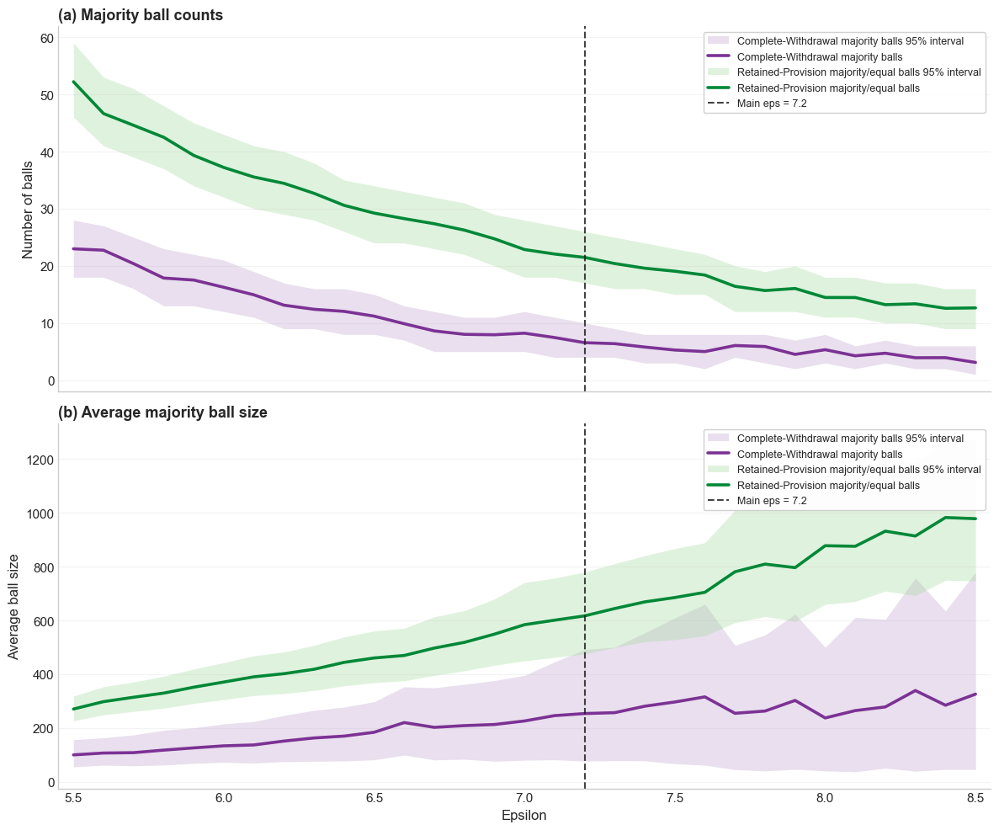

In [19]:
# Summarise the 50% majority-rule runs and plot empirical 95% seed intervals.
from functools import partial

q025_majority = partial(np.nanpercentile, q=2.5)
q975_majority = partial(np.nanpercentile, q=97.5)
area_majority_50_ci = area_majority_50_results.groupby("eps").agg(
    n_pos_mean=("n_majority", "mean"), n_pos_lo=("n_majority", q025_majority), n_pos_hi=("n_majority", q975_majority),
    n_neg_mean=("n_majority_comparison", "mean"), n_neg_lo=("n_majority_comparison", q025_majority), n_neg_hi=("n_majority_comparison", q975_majority),
    sz_pos_mean=("sz_majority", "mean"), sz_pos_lo=("sz_majority", q025_majority), sz_pos_hi=("sz_majority", q975_majority),
    sz_neg_mean=("sz_majority_comparison", "mean"), sz_neg_lo=("sz_majority_comparison", q025_majority), sz_neg_hi=("sz_majority_comparison", q975_majority),
).reset_index()
area_majority_50_ci.insert(1, "threshold", MAJORITY_THRESHOLD)
area_majority_50_ci.to_csv(
    TABLE_DIR / "area_tdabm_majority_50_percentile_summary.csv", index=False
)
display(area_majority_50_ci)

plt.style.use("seaborn-v0_8-whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
fig.patch.set_facecolor("white")
eps_x = area_majority_50_ci["eps"].to_numpy(dtype=float)

for ax, pos_prefix, neg_prefix, ylabel, subtitle in [
    (axes[0], "n_pos", "n_neg", "Number of balls", "(a) Majority ball counts"),
    (axes[1], "sz_pos", "sz_neg", "Average ball size", "(b) Average majority ball size"),
]:
    ax.fill_between(eps_x, area_majority_50_ci[f"{pos_prefix}_lo"], area_majority_50_ci[f"{pos_prefix}_hi"], color=LANDMARK_COL_POS_CI, alpha=0.35, linewidth=0, label="Complete-Withdrawal majority balls 95% interval")
    ax.plot(eps_x, area_majority_50_ci[f"{pos_prefix}_mean"], color=LANDMARK_COL_POS, linewidth=2.6, label="Complete-Withdrawal majority balls")
    ax.fill_between(eps_x, area_majority_50_ci[f"{neg_prefix}_lo"], area_majority_50_ci[f"{neg_prefix}_hi"], color=LANDMARK_COL_NEG_CI, alpha=0.35, linewidth=0, label="Retained-Provision majority/equal balls 95% interval")
    ax.plot(eps_x, area_majority_50_ci[f"{neg_prefix}_mean"], color=LANDMARK_COL_NEG, linewidth=2.6, label="Retained-Provision majority/equal balls")
    ax.axvline(EPS_MAIN, color="#222222", linestyle="--", linewidth=1.5, alpha=0.85, label=f"Main eps = {EPS_MAIN}")
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_title(subtitle, loc="left", fontsize=13, fontweight="bold")
    ax.grid(True, axis="y", alpha=0.22)
    ax.grid(False, axis="x")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11)

axes[1].set_xlabel("Epsilon", fontsize=12)
axes[1].set_xticks([5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5])
axes[1].set_xlim(5.45, 8.55)
axes[0].legend(fontsize=9, loc="upper right", frameon=True, framealpha=0.92)
axes[1].legend(fontsize=9, loc="upper right", frameon=True, framealpha=0.92)
plt.tight_layout()
plt.savefig(FIG_DIR / "area_tdabm_majority_50_percentile_ranges.png", dpi=180, bbox_inches="tight", facecolor="white")
plt.show()
